<a href="https://colab.research.google.com/github/Aleberevl/Proyecto_Integrador/blob/Semana3/Avance1_Equipo1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Avance 1 — Exploratory Data Analysis (EDA)

**Equipo:** *Avance1_#Equipo1*  
**Integrantes:**
*Alejandra Berenice Vega López - a01795415@tec.mx*
*Paul Andrés Yungán Pinduisaca - a01795702@tec.mx*
*Jonathan Ardash Hernández Cruz - a01795404@tec.mx*  

**Proyecto Integrador:** **REINSURE.AI** — Detección de discrepancias en slips y notas de cobertura con IA (IBM Watsonx) para THB México (alcance LATAM).

## Descripción del documento
Este cuaderno contiene el **Análisis Exploratorio de Datos (EDA)** del Avance 1. El propósito es
describir, diagnosticar y preparar los datos para las siguientes etapas del proyecto (modelado y evaluación),
atendiendo los objetivos establecidos:

- **2.1** Elegir las características más relevantes para reducir la dimensionalidad y aumentar la capacidad de generalización del modelo.
- **2.2** Abordar y corregir los problemas identificados en los datos.

## Contexto y guía para la presentación
- **Contexto de negocio:** en reaseguro facultativo, existen discrepancias entre lo solicitado (pre-nota) y lo cotizado por reaseguradores. El objetivo del sistema es **detectar** y **reportar** dichas discrepancias con trazabilidad.
- **Enfoque del EDA:** evaluar estructura, calidad de datos (faltantes, tipos), cardinalidad, outliers, sesgos y relaciones entre variables.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.spatial import distance
from scipy.stats import chi2
from itertools import combinations
from statsmodels.tsa.seasonal import seasonal_decompose


from google.colab import drive
drive.mount('/content/drive')

# Cargar el archivo CSV en un DataFrame
df = pd.read_csv("/content/drive/MyDrive/proyecto_integrador/reinsurance_data_thb.csv")

# Dimensiones del DataFrame
print("Dimensiones del DataFrame:", df.shape)
print("Columnas disponibles:", df.columns.tolist())

# Mostrar las primeras filas del DataFrame para verificar la carga
print("Primeras filas del DataFrame:")
display(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dimensiones del DataFrame: (2127, 33)
Columnas disponibles: ['Folio', 'record_type', 'tipo', 'ramo', 'reinsurer', 'participation', 'reasegurado', 'asegurado', 'direccion', 'periodo_inicio', 'periodo_fin', 'actividad', 'estimado_ingresos ', 'interes_asegurable', 'limite_max_res ', 'riesgos_cubiertos', 'condiciones_reaseguro', 'exclusiones', 'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ', 'deducible_Electricos ', 'deducible_Ingresos ', 'prima_neta ', 'soporte', 'base_cobertura', 'territorialidad', 'jurisdiccion', 'dias_pago', 'anexos_clausulas', 'texto_clausulas', 'panel_participantes', 'moneda']
Primeras filas del DataFrame:


,Folio,record_type,tipo,ramo,reinsurer,participation,reasegurado,asegurado,direccion,periodo_inicio,...,prima_neta,soporte,base_cobertura,territorialidad,jurisdiccion,dias_pago,anexos_clausulas,texto_clausulas,panel_participantes,moneda
0,NC/000001/2016/2017,Pre-nota de Cobertura,Reaseguro Facultativo,Transportes,"Mercury, Pisces",100,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,4003402,100,Claims Made,México,Leyes mexicanas,26,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
1,NC/000001/2016/2017,Soporte,Reaseguro Facultativo,Transportes,Mercury,55,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,2201871,55,Claims Made,México,Leyes mexicanas,36,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
2,NC/000001/2016/2017,Soporte,Reaseguro Facultativo,Transportes,Pisces,45,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,1801531,45,Claims Made,México,Leyes mexicanas,54,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
3,NC/000002/2024/2025,Pre-nota de Cobertura,Reaseguro Facultativo,Responsabilidad Civil,Andromeda,100,Aseguradora del Norte,"Tecnologías Avanzadas, S.A.","Tijuana, Baja California",23/04/24 0:00,...,4955124,100,Claims Made,México,Leyes mexicanas,30,"NMA 2737, LMA 3100A, Endorsement 1234, NMA 280...","Cooperacion de reclamos, Limitación de Sancion...",Andromeda 100%,MXN
4,NC/000002/2024/2025,Soporte,Reaseguro Facultativo,Responsabilidad Civil,Andromeda,100,Aseguradora del Norte,"Tecnologías Avanzadas, S.A.","Tijuana, Baja California",23/04/24 0:00,...,4955124,100,Claims Made,México,Leyes mexicanas,54,"NMA 2737, LMA 3100A, Endorsement 1234, NMA 280...","Cooperacion de reclamos, Limitación de Sancion...",Andromeda 100%,MXN


## Estructura de los Datos

## Análisis inicial y preprocesamiento de fechas

Se muestran las primeras filas, información general y estadísticas descriptivas y se convierte las columnas `periodo_inicio` y `periodo_fin` a tipo fecha.


In [3]:
# 1. Mostrar las primeras 5 filas del DataFrame
print("Primeras 5 filas del DataFrame:")
display(df.head())

# 2. Mostrar información concisa del DataFrame
print("\nInformación del DataFrame:")
display(df.info())

# 3. Generar estadísticas descriptivas de las columnas numéricas
print("\nEstadísticas descriptivas de las columnas numéricas:")
display(df.describe().T)

# 4. Convertir las columnas 'periodo_inicio' y 'periodo_fin' a tipo datetime
# Se usa errors='coerce' para manejar posibles errores de formato, convirtiéndolos a NaT
df['periodo_inicio'] = pd.to_datetime(df['periodo_inicio'], errors='coerce')
df['periodo_fin'] = pd.to_datetime(df['periodo_fin'], errors='coerce')

# 5. Mostrar la información del DataFrame nuevamente para confirmar la conversión
print("\nInformación del DataFrame después de la conversión de fechas:")
display(df.info())

Primeras 5 filas del DataFrame:


,Folio,record_type,tipo,ramo,reinsurer,participation,reasegurado,asegurado,direccion,periodo_inicio,...,prima_neta,soporte,base_cobertura,territorialidad,jurisdiccion,dias_pago,anexos_clausulas,texto_clausulas,panel_participantes,moneda
0,NC/000001/2016/2017,Pre-nota de Cobertura,Reaseguro Facultativo,Transportes,"Mercury, Pisces",100,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,4003402,100,Claims Made,México,Leyes mexicanas,26,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
1,NC/000001/2016/2017,Soporte,Reaseguro Facultativo,Transportes,Mercury,55,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,2201871,55,Claims Made,México,Leyes mexicanas,36,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
2,NC/000001/2016/2017,Soporte,Reaseguro Facultativo,Transportes,Pisces,45,Aseguradora del Norte,Servicios Financieros Unión,"San Luis Potosí, San Luis Potosí",14/10/16 0:00,...,1801531,45,Claims Made,México,Leyes mexicanas,54,"NMA 2737, Endorsement 5678, NMA 2962, LMA 3092...","Cooperacion de reclamos, All Risks; Prevención...","Mercury 55%, Pisces 45%",MXN
3,NC/000002/2024/2025,Pre-nota de Cobertura,Reaseguro Facultativo,Responsabilidad Civil,Andromeda,100,Aseguradora del Norte,"Tecnologías Avanzadas, S.A.","Tijuana, Baja California",23/04/24 0:00,...,4955124,100,Claims Made,México,Leyes mexicanas,30,"NMA 2737, LMA 3100A, Endorsement 1234, NMA 280...","Cooperacion de reclamos, Limitación de Sancion...",Andromeda 100%,MXN
4,NC/000002/2024/2025,Soporte,Reaseguro Facultativo,Responsabilidad Civil,Andromeda,100,Aseguradora del Norte,"Tecnologías Avanzadas, S.A.","Tijuana, Baja California",23/04/24 0:00,...,4955124,100,Claims Made,México,Leyes mexicanas,54,"NMA 2737, LMA 3100A, Endorsement 1234, NMA 280...","Cooperacion de reclamos, Limitación de Sancion...",Andromeda 100%,MXN



Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2127 entries, 0 to 2126
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Folio                  2127 non-null   object
 1   record_type            2127 non-null   object
 2   tipo                   2127 non-null   object
 3   ramo                   2127 non-null   object
 4   reinsurer              2127 non-null   object
 5   participation          2127 non-null   int64 
 6   reasegurado            2127 non-null   object
 7   asegurado              2127 non-null   object
 8   direccion              2127 non-null   object
 9   periodo_inicio         2127 non-null   object
 10  periodo_fin            2127 non-null   object
 11  actividad              2127 non-null   object
 12  estimado_ingresos      2127 non-null   int64 
 13  interes_asegurable     2127 non-null   object
 14  limite_max_res         2127 non-null   int64

None


Estadísticas descriptivas de las columnas numéricas:


,count,mean,std,min,25%,50%,75%,max
participation,2127.0,5.641749e+01,4.008598e+01,0.0,14.0,52.0,100.0,100.0
estimado_ingresos,2127.0,5.058462e+07,2.924528e+07,1080009.0,23249898.5,52447859.0,77415823.0,99218692.0
limite_max_res,2127.0,2.557410e+08,1.399744e+08,10583207.0,141954697.0,249708032.0,377953920.0,498178098.0
deducible_General,2127.0,6.087209e+04,2.276098e+04,20012.0,41823.5,61721.0,81781.0,99963.0
deducible_Robo,2127.0,5.926634e+04,2.351167e+04,20064.0,38705.0,58774.0,79596.0,99993.0
deducible_Terremoto,2127.0,5.957083e+04,2.206542e+04,20032.0,41405.0,61088.0,76881.0,100000.0
deducible_Electricos,2127.0,6.099322e+04,2.272386e+04,20085.0,40582.0,64063.0,77629.5,99930.0
deducible_Ingresos,2127.0,5.959562e+04,2.215942e+04,20207.0,40885.0,59929.0,76675.0,99791.0
soporte,2127.0,5.641749e+01,4.008598e+01,0.0,14.0,52.0,100.0,100.0
dias_pago,2127.0,4.010719e+01,1.175442e+01,20.0,30.0,40.0,50.0,60.0



Información del DataFrame después de la conversión de fechas:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2127 entries, 0 to 2126
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Folio                  2127 non-null   object        
 1   record_type            2127 non-null   object        
 2   tipo                   2127 non-null   object        
 3   ramo                   2127 non-null   object        
 4   reinsurer              2127 non-null   object        
 5   participation          2127 non-null   int64         
 6   reasegurado            2127 non-null   object        
 7   asegurado              2127 non-null   object        
 8   direccion              2127 non-null   object        
 9   periodo_inicio         2127 non-null   datetime64[ns]
 10  periodo_fin            2127 non-null   datetime64[ns]
 11  actividad              2127 non-null   object        
 12 

/tmp/ipython-input-3125183191.py:15: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['periodo_inicio'] = pd.to_datetime(df['periodo_inicio'], errors='coerce')
/tmp/ipython-input-3125183191.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['periodo_fin'] = pd.to_datetime(df['periodo_fin'], errors='coerce')


None

## Análisis de valores faltantes

Se identifica la presencia de valores faltantes y se visualizan.


In [4]:
# 1. Calcular el número total de valores faltantes por columna
missing_values_count = df.isnull().sum()

# 2. Calcular el porcentaje de valores faltantes por columna
missing_values_percentage = (missing_values_count / len(df)) * 100

# 3. Mostrar las columnas con valores faltantes y su respectivo porcentaje
missing_values_summary = pd.DataFrame({
    'Número de Valores Faltantes': missing_values_count,
    'Porcentaje de Valores Faltantes': missing_values_percentage
})

# Filtrar para mostrar solo columnas con al menos un valor faltante
missing_values_summary = missing_values_summary[missing_values_summary['Número de Valores Faltantes'] > 0].sort_values(by='Porcentaje de Valores Faltantes', ascending=False)

print("Resumen de valores faltantes por columna:")
display(missing_values_summary)

Resumen de valores faltantes por columna:


,Número de Valores Faltantes,Porcentaje de Valores Faltantes


No se detecta valores faltantes

## Análisis univariante

Se explorar la distribución de cada variable individualmente (variables numéricas y categóricas) utilizando estadísticas y visualizaciones apropiadas.


Estadísticas descriptivas para columnas numéricas:


,count,mean,min,25%,50%,75%,max,std
participation,2127.0,56.417489,0.0,14.0,52.0,100.0,100.0,40.08598
periodo_inicio,2127,2020-02-17 10:56:01.354019840,2015-01-16 00:00:00,2017-09-12 00:00:00,2020-04-10 00:00:00,2022-09-02 12:00:00,2024-12-24 00:00:00,NaN
periodo_fin,2127,2021-02-15 10:15:24.118476800,2016-01-12 00:00:00,2018-09-12 00:00:00,2021-04-10 00:00:00,2023-09-02 12:00:00,2025-12-24 00:00:00,NaN
estimado_ingresos,2127.0,50584618.085567,1080009.0,23249898.5,52447859.0,77415823.0,99218692.0,29245275.93117
limite_max_res,2127.0,255740982.024918,10583207.0,141954697.0,249708032.0,377953920.0,498178098.0,139974363.301466
deducible_General,2127.0,60872.087917,20012.0,41823.5,61721.0,81781.0,99963.0,22760.983913
deducible_Robo,2127.0,59266.344617,20064.0,38705.0,58774.0,79596.0,99993.0,23511.671933
deducible_Terremoto,2127.0,59570.826046,20032.0,41405.0,61088.0,76881.0,100000.0,22065.417187
deducible_Electricos,2127.0,60993.215327,20085.0,40582.0,64063.0,77629.5,99930.0,22723.86348
deducible_Ingresos,2127.0,59595.616831,20207.0,40885.0,59929.0,76675.0,99791.0,22159.418226



Estadísticas descriptivas para columnas categóricas:


,count,unique,top,freq
Folio,2127,600,NC/000325/2016/2017,16
record_type,2127,2,Soporte,1527
tipo,2127,1,Reaseguro Facultativo,2127
ramo,2127,9,Responsabilidad Civil,260
reinsurer,2127,352,Orion,97
reasegurado,2127,6,Aseguradora del Norte,411
asegurado,2127,6,Operadora Marina de México,405
direccion,2127,10,"Veracruz, Veracruz",272
actividad,2127,9,Prestación de servicios,260
interes_asegurable,2127,1,Daños materiales y pérdidas por cualquier causa,2127



Visualización de la distribución de columnas numéricas (Histogramas):


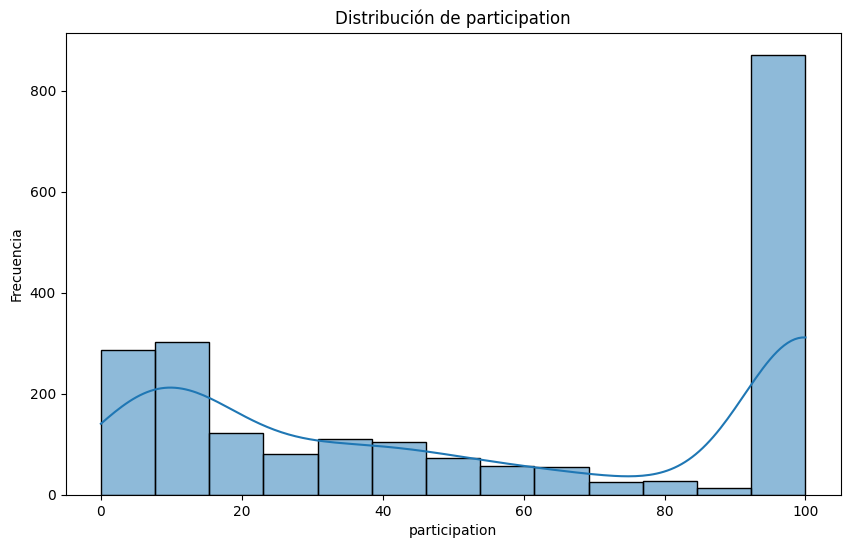

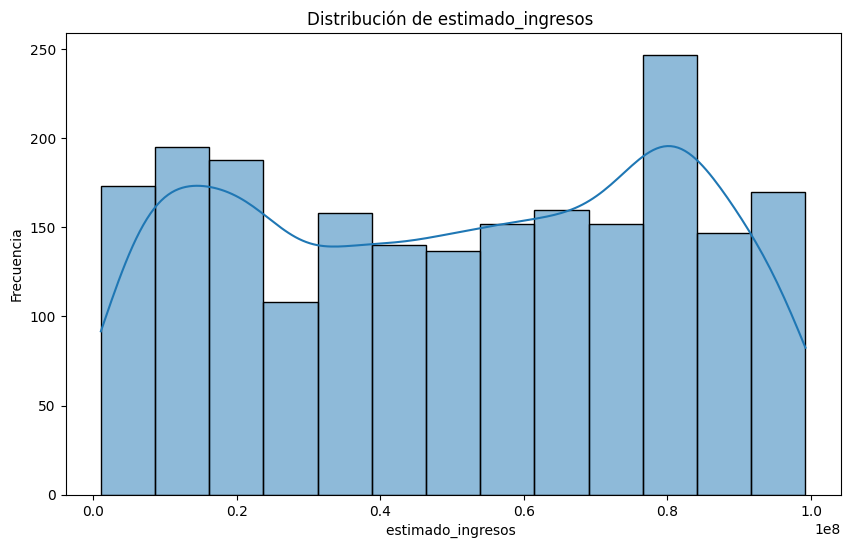

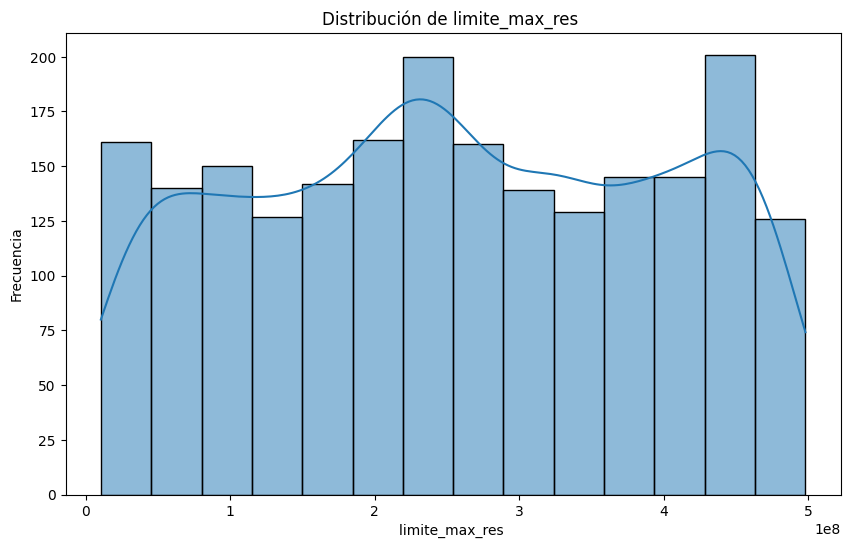

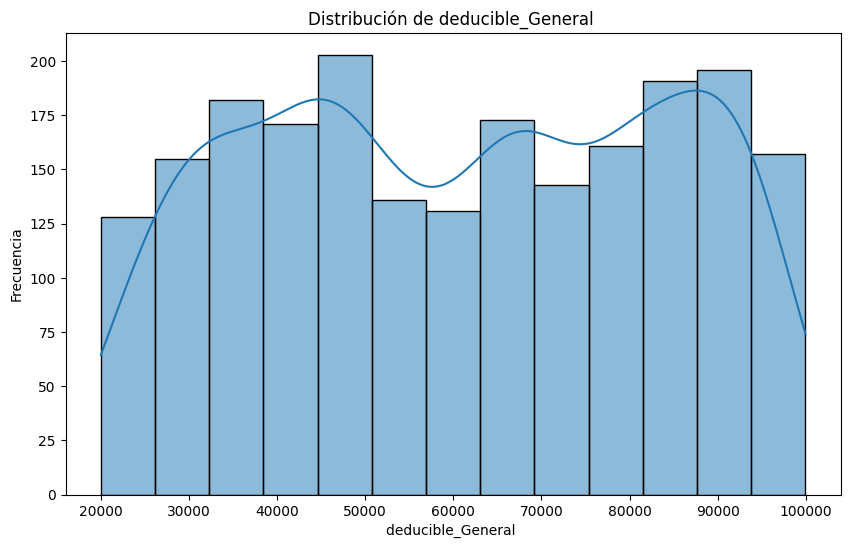

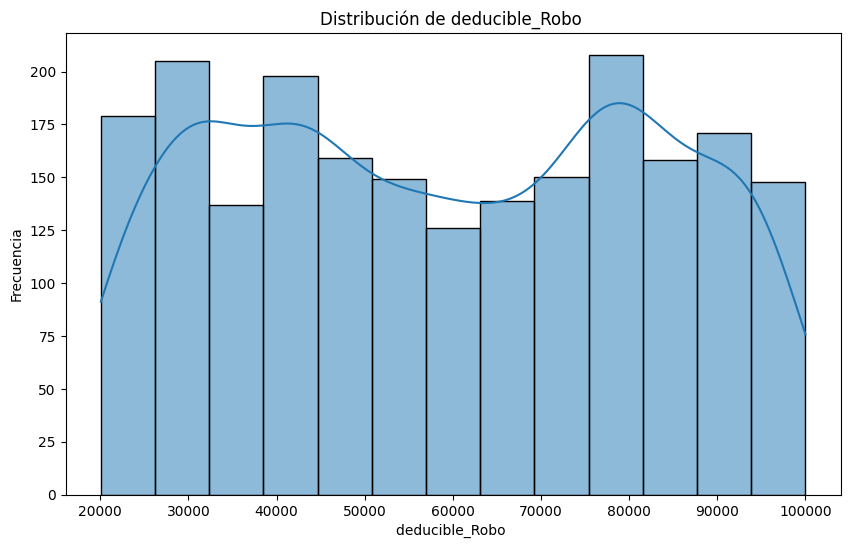

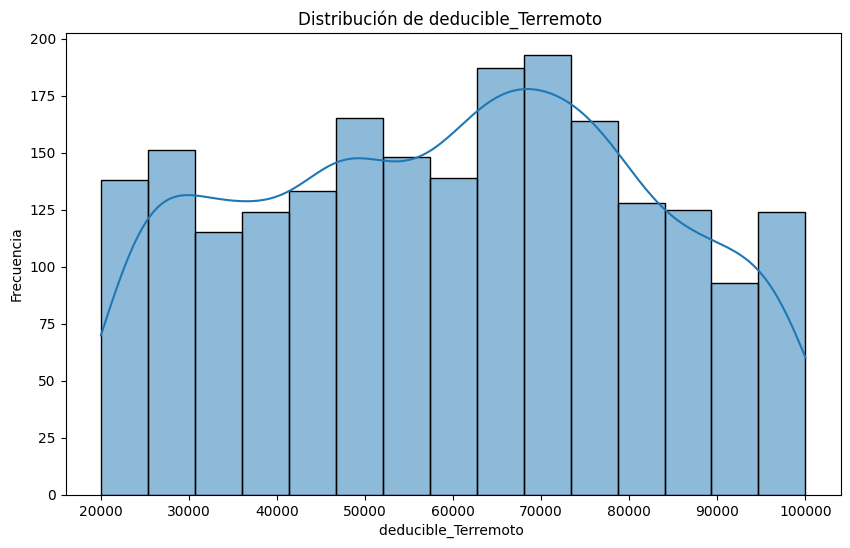

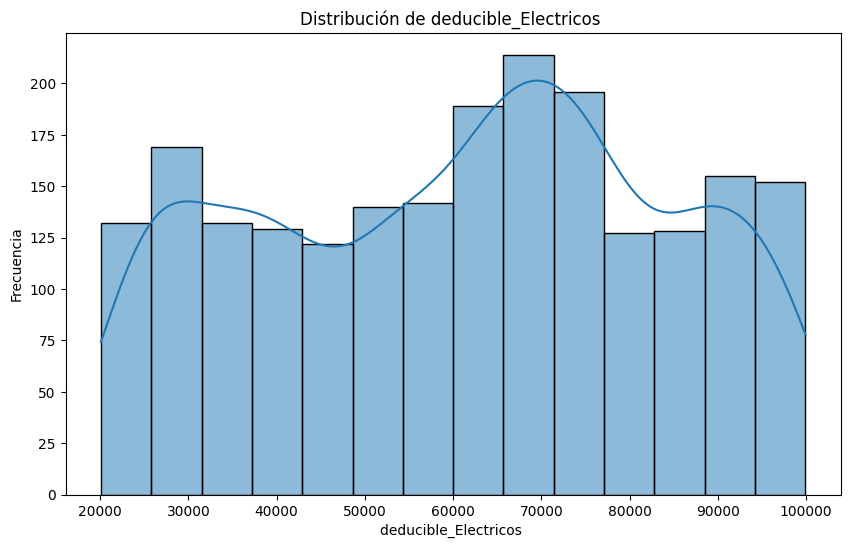

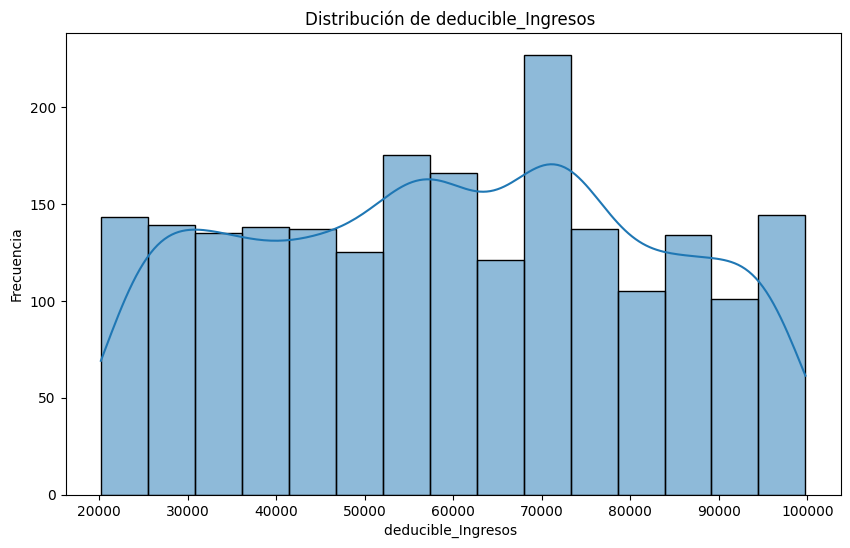

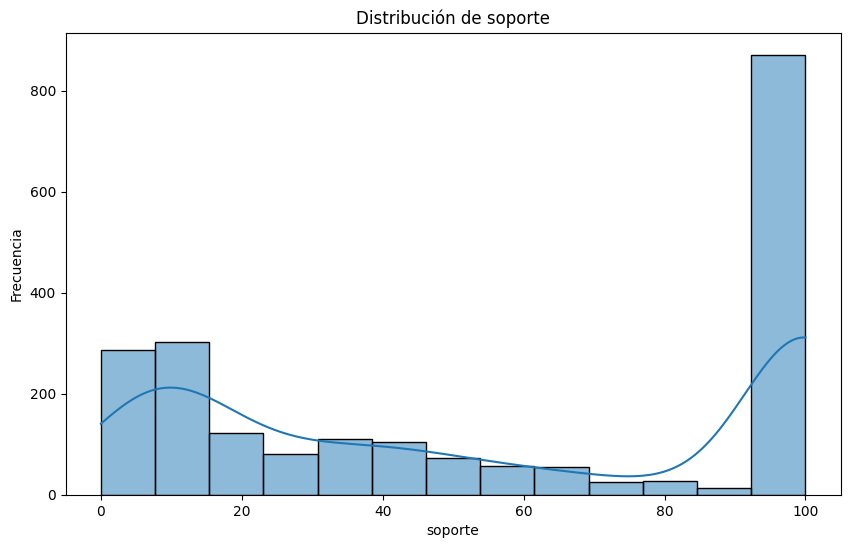

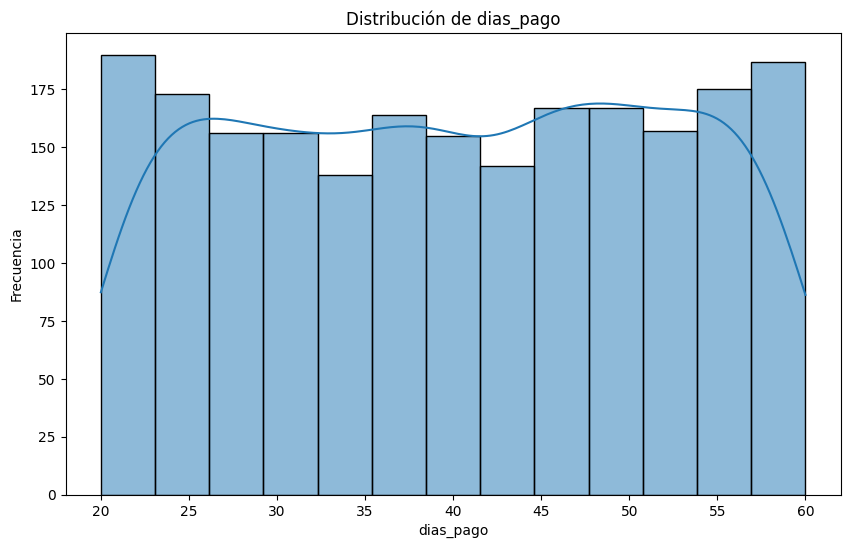


Visualización de la distribución de columnas categóricas (Gráficos de barras):


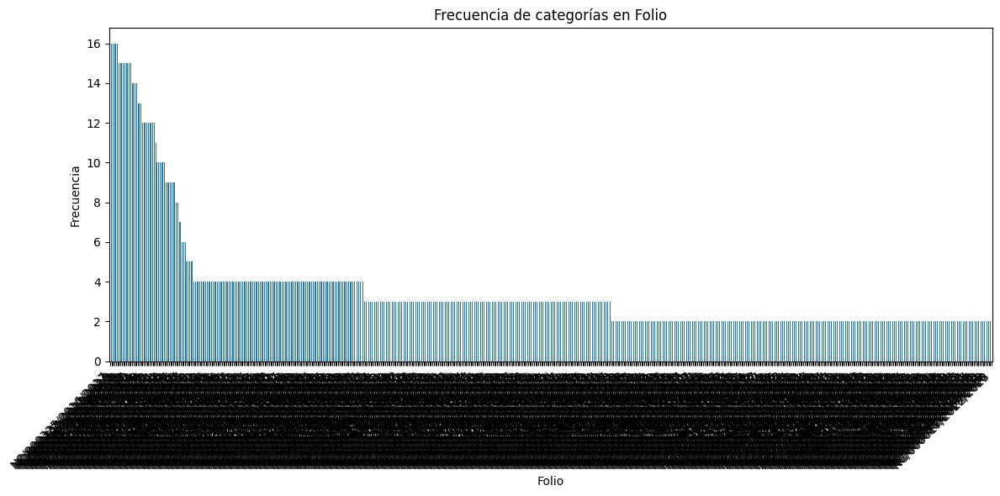

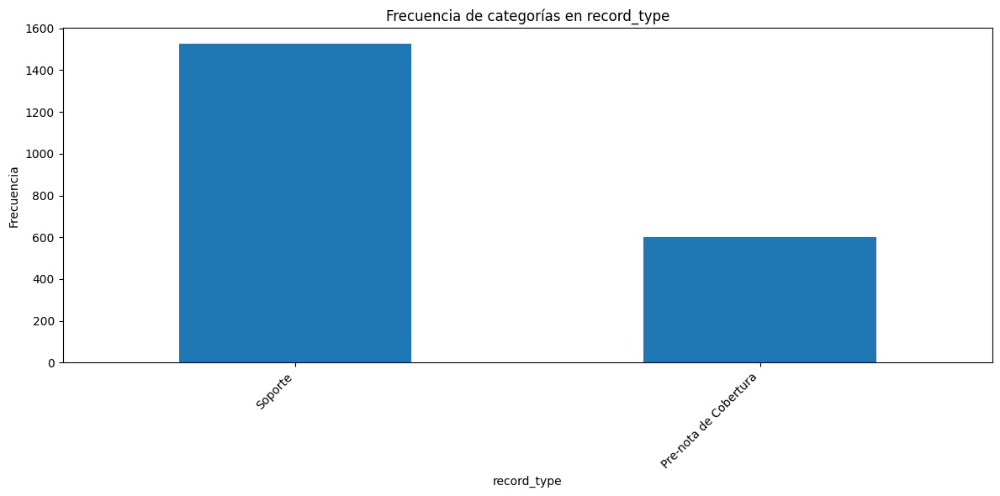

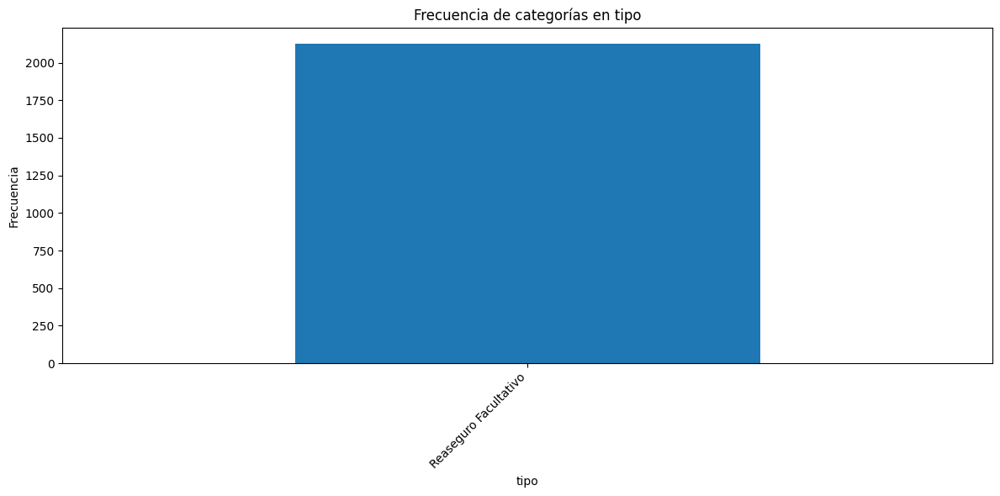

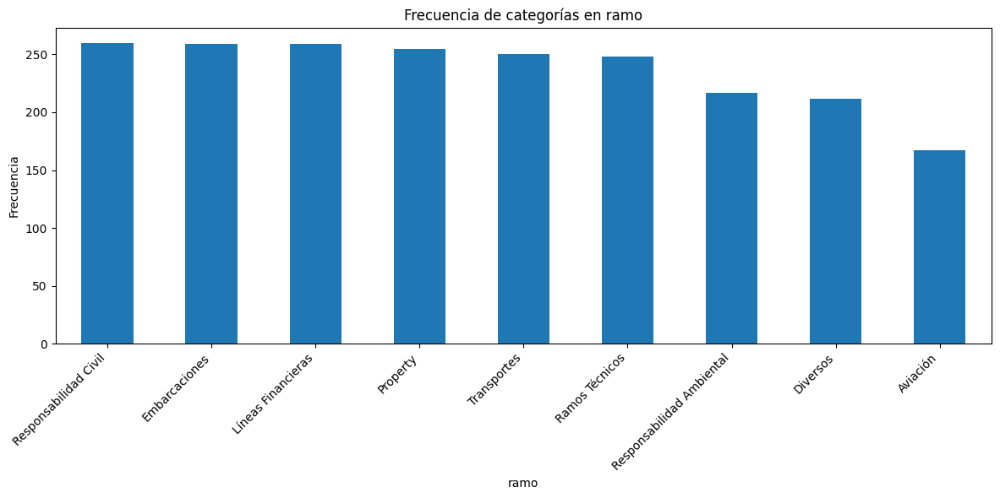

/tmp/ipython-input-2091127475.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


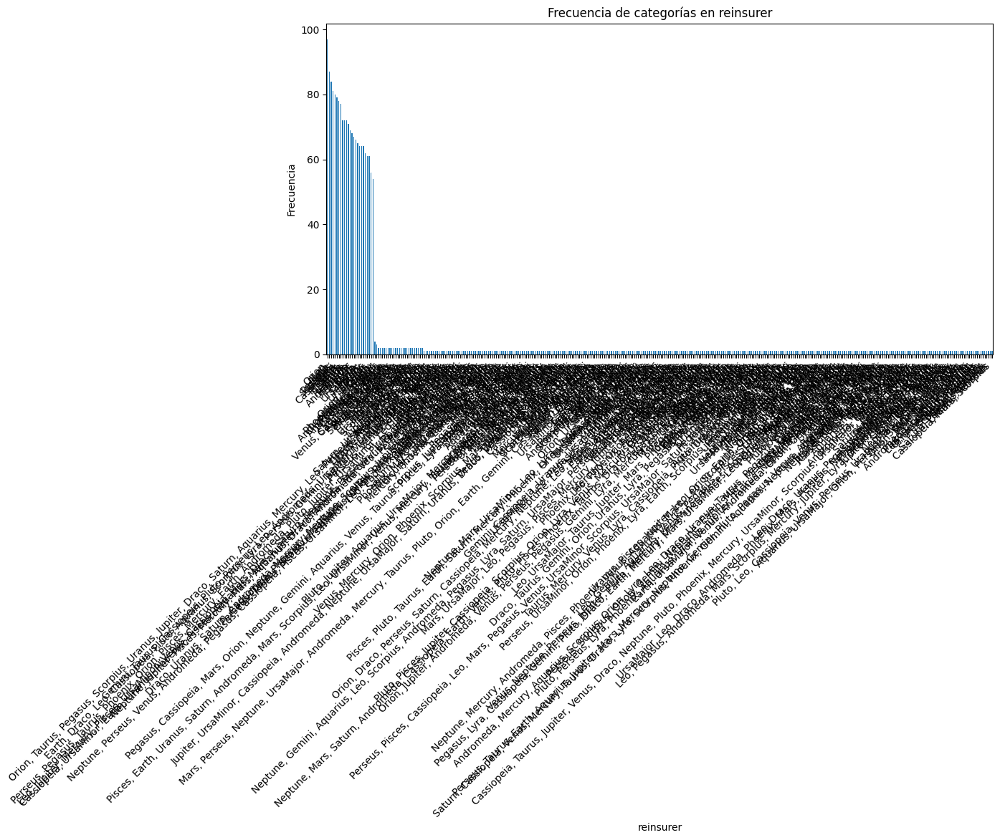

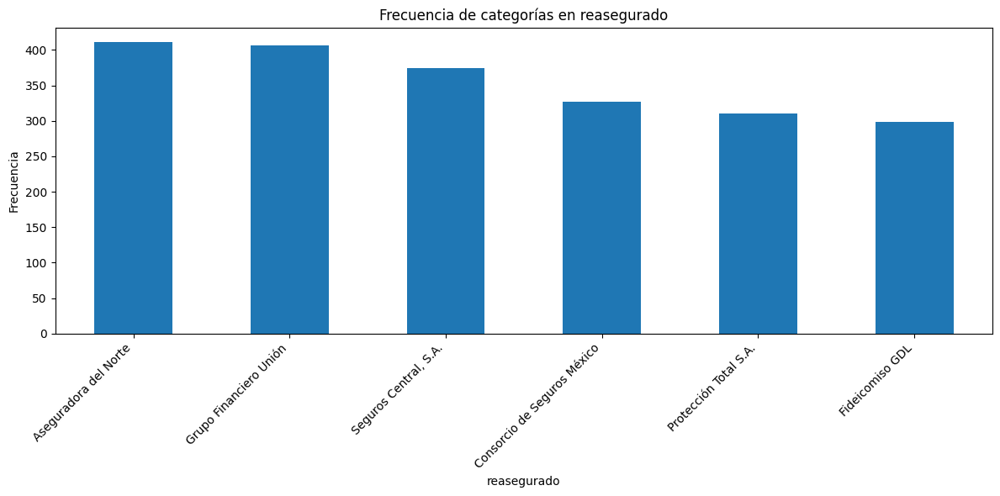

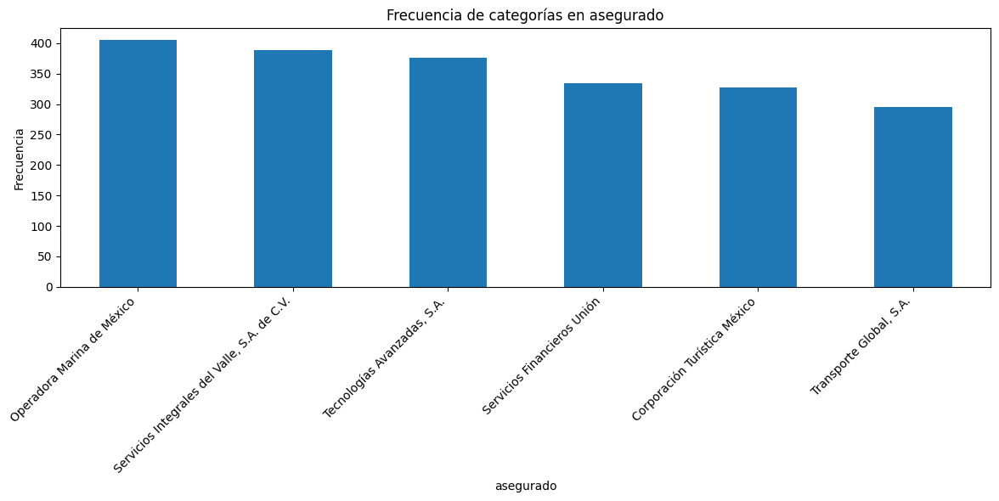

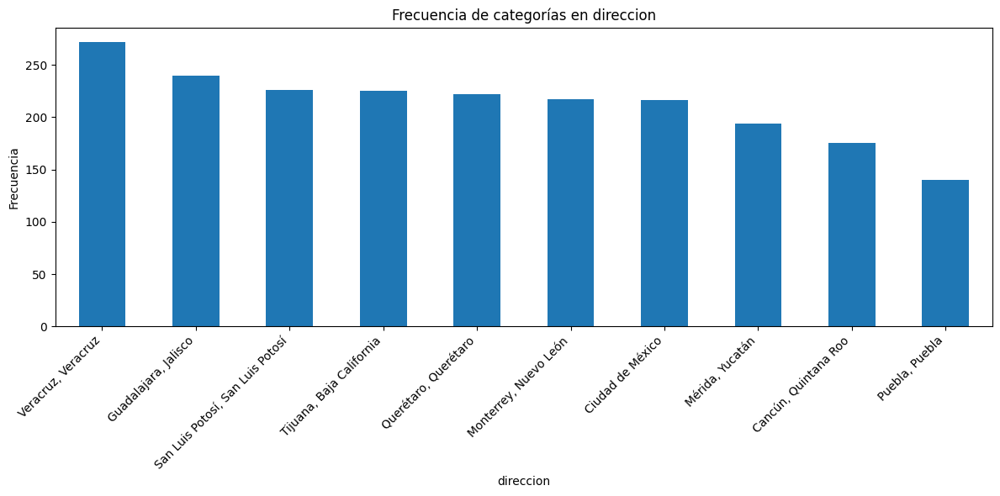

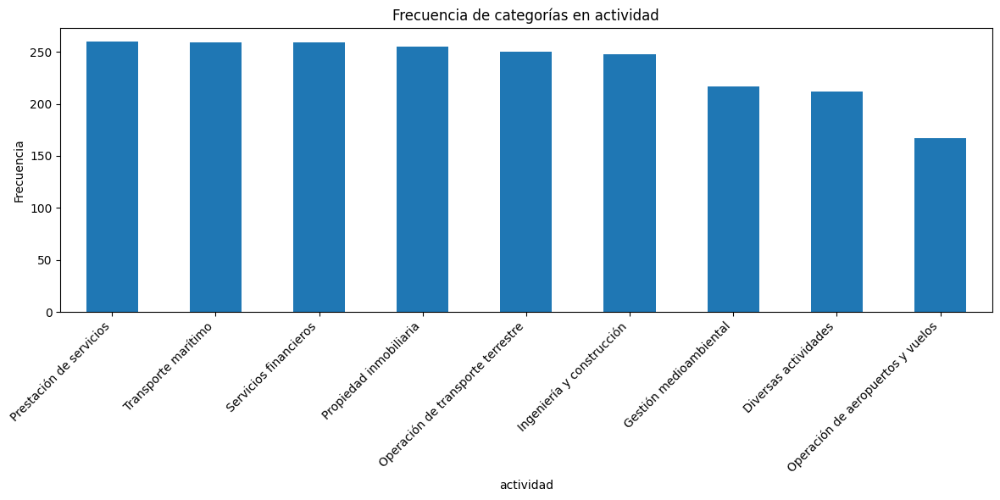

...

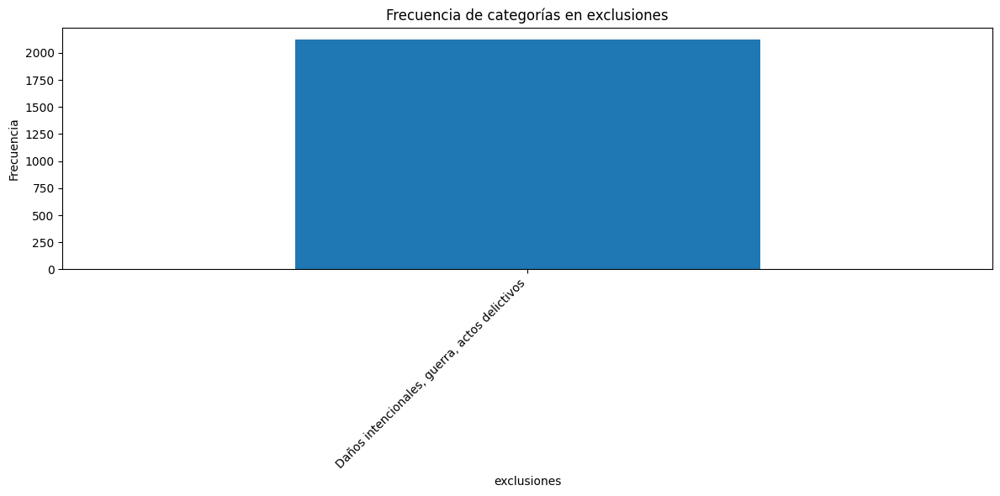

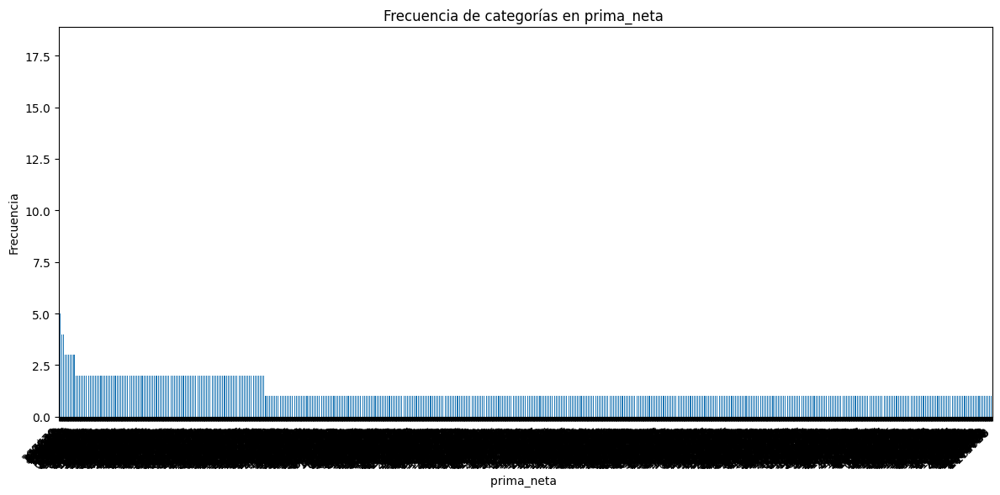

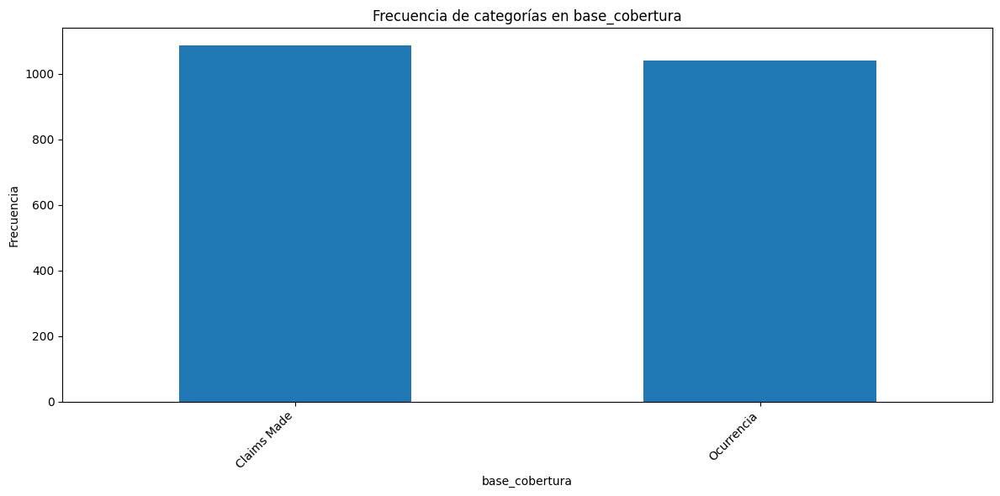

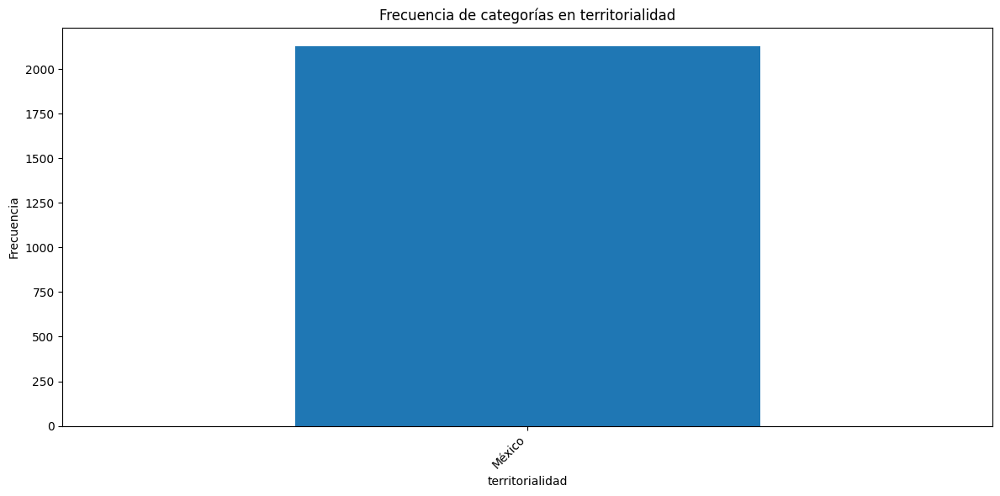

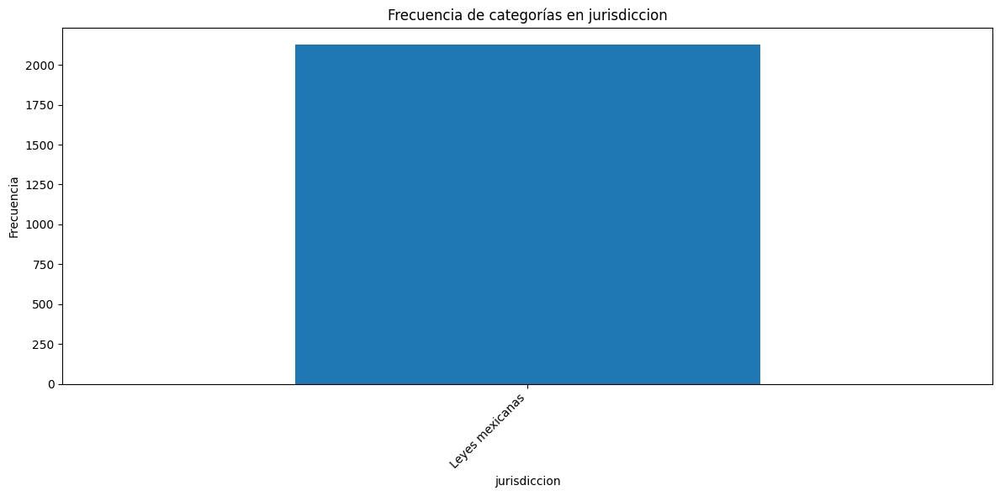

/tmp/ipython-input-2091127475.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


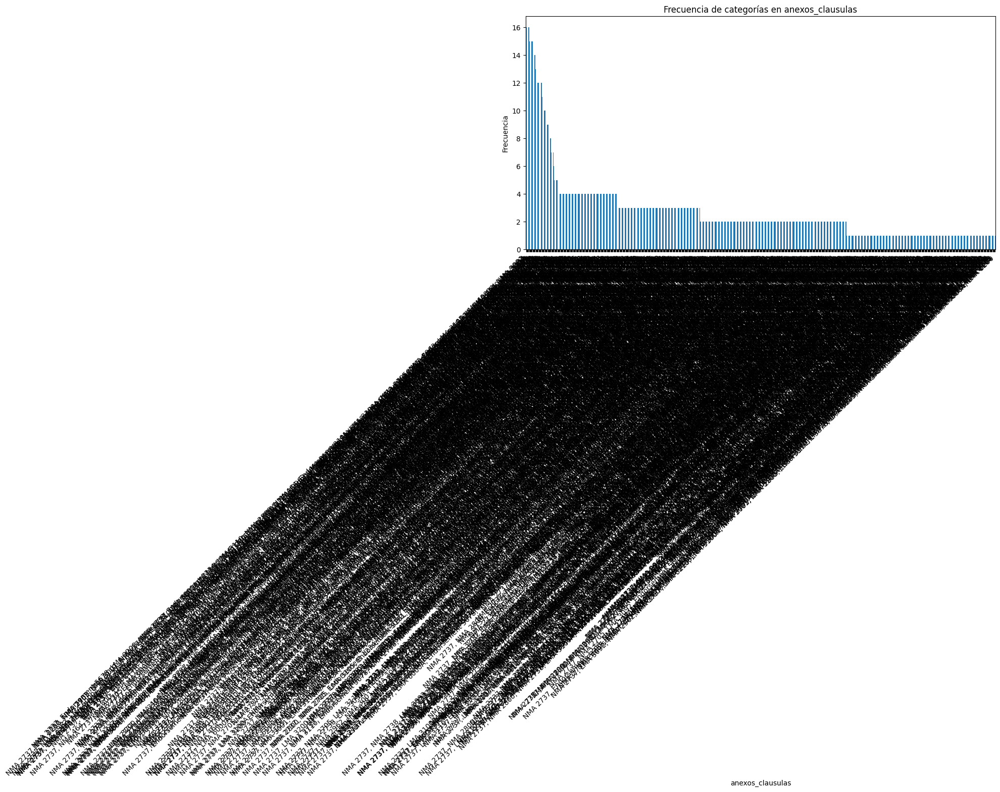

/tmp/ipython-input-2091127475.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


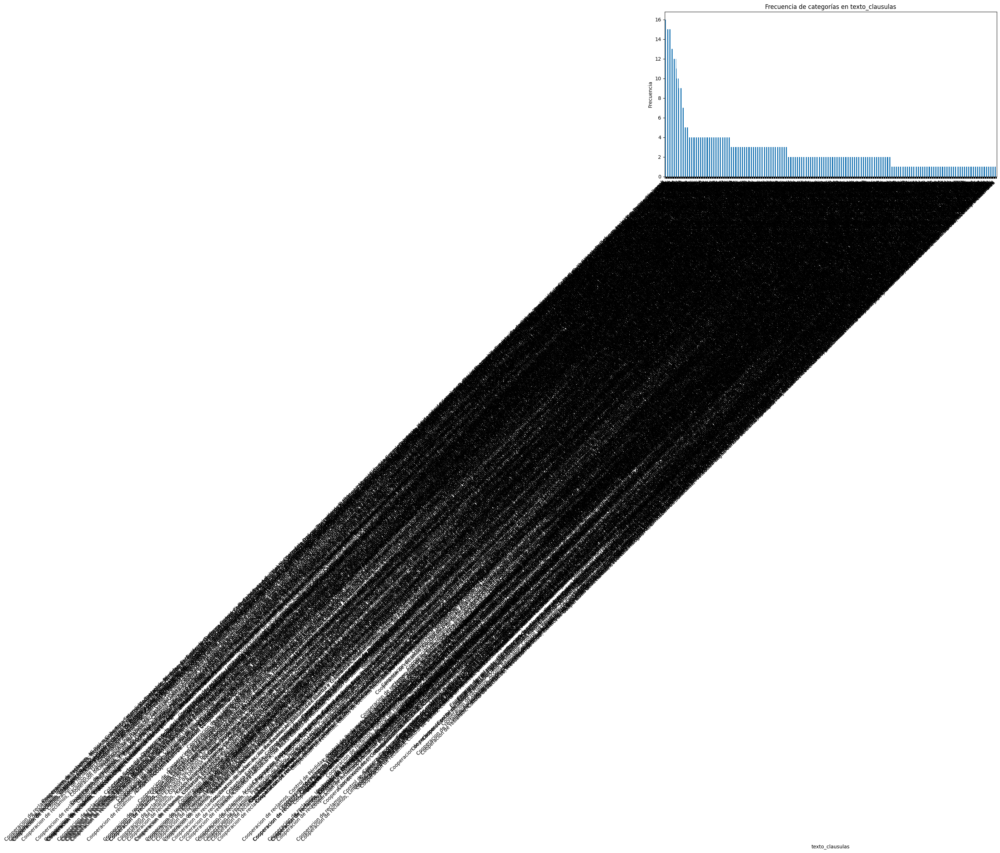

/tmp/ipython-input-2091127475.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


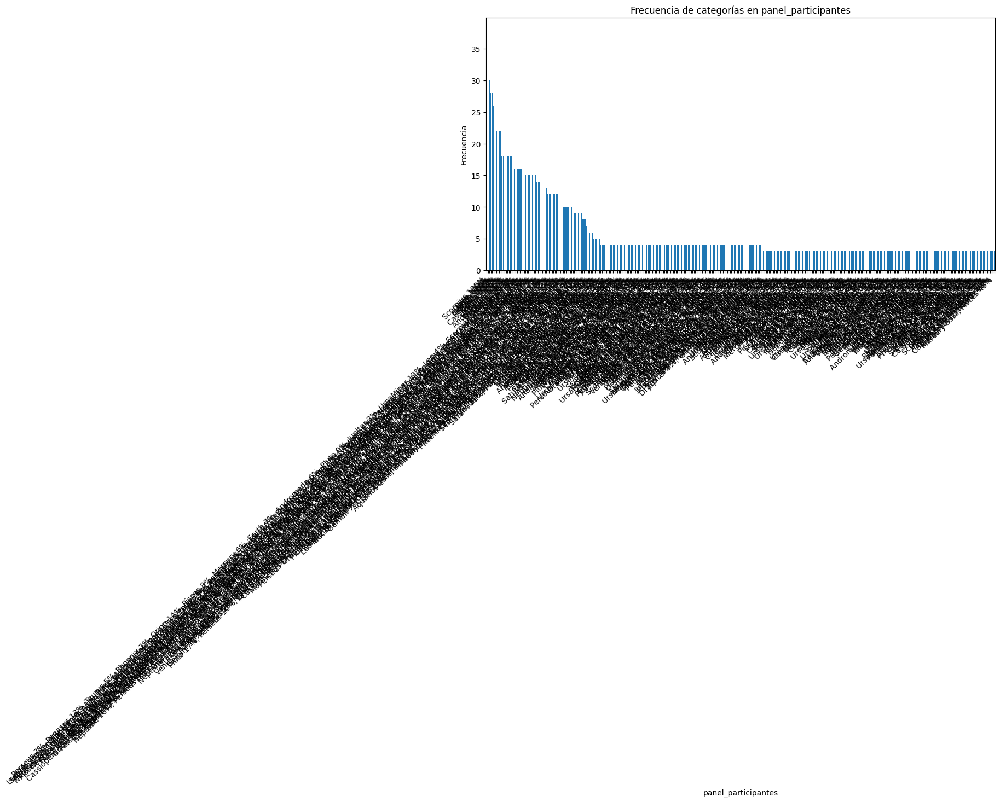

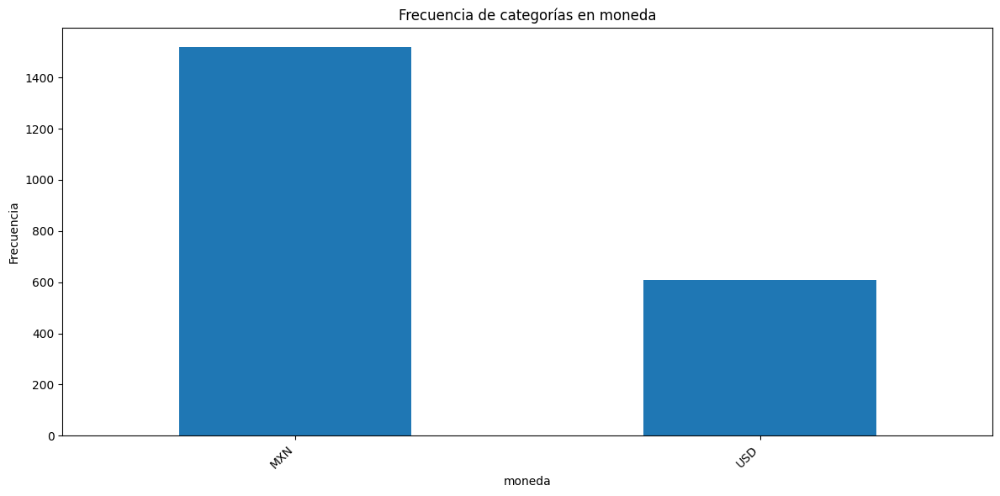

In [5]:
# Separar columnas numéricas y categóricas
numerical_cols = df.select_dtypes(include=['int64', 'float64', 'datetime64[ns]']).columns
categorical_cols = df.select_dtypes(include=['object']).columns

print("Estadísticas descriptivas para columnas numéricas:")
display(df[numerical_cols].describe().T)

print("\nEstadísticas descriptivas para columnas categóricas:")
display(df[categorical_cols].describe().T)

# Visualizar distribuciones de columnas numéricas
print("\nVisualización de la distribución de columnas numéricas (Histogramas):")
for col in numerical_cols:
    if df[col].dtype != 'datetime64[ns]': # Excluir columnas de fecha para histogramas simples
        plt.figure(figsize=(10, 6))
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribución de {col}')
        plt.xlabel(col)
        plt.ylabel('Frecuencia')
        plt.show()

# Visualizar distribuciones de columnas categóricas
print("\nVisualización de la distribución de columnas categóricas (Gráficos de barras):")
for col in categorical_cols:
    plt.figure(figsize=(12, 6))
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Frecuencia de categorías en {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

## Análisis de valores atípicos


Se identifican posibles valores atípicos en las variables numéricas y se comenta su posible tratamiento.


### Análisis de valores atípicos Univariable

Columnas numéricas identificadas para análisis de outliers:
Index(['participation', 'estimado_ingresos ', 'limite_max_res ',
       'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ',
       'deducible_Electricos ', 'deducible_Ingresos ', 'soporte', 'dias_pago'],
      dtype='object')

Generando Box Plots para columnas numéricas:


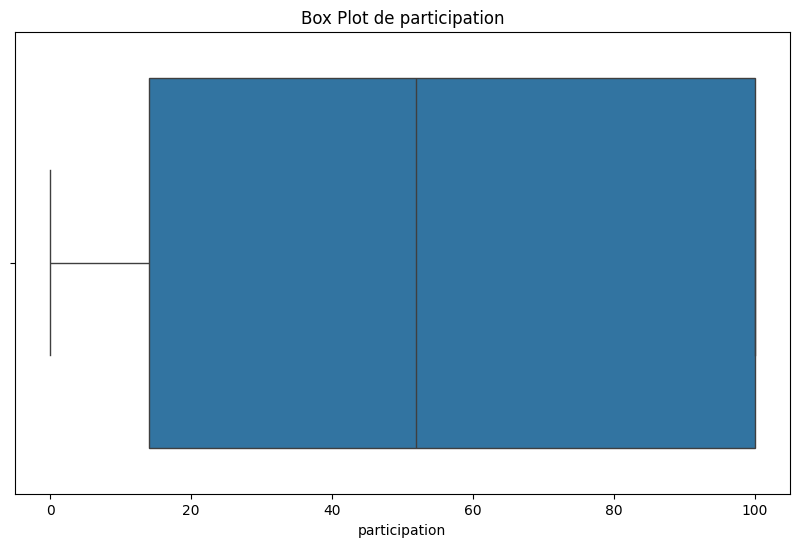

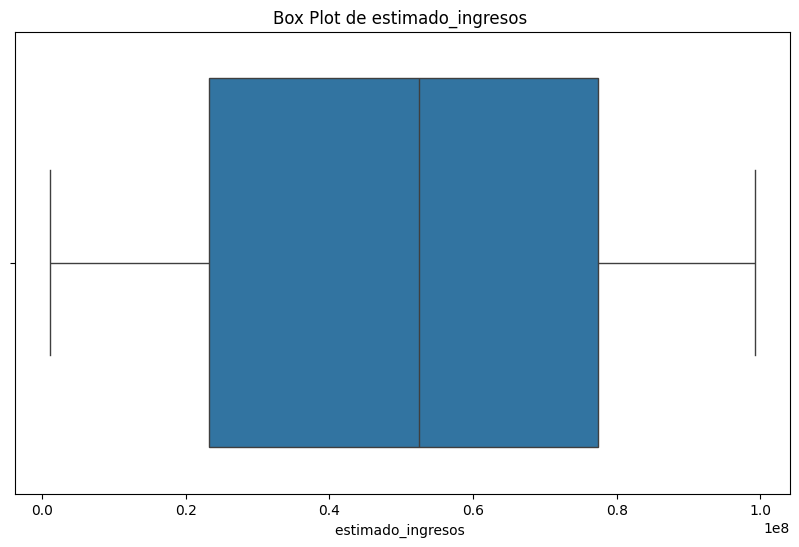

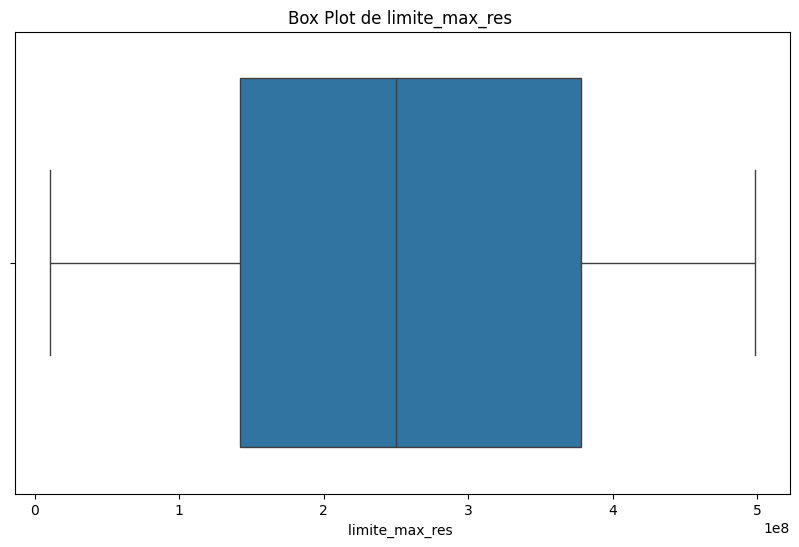

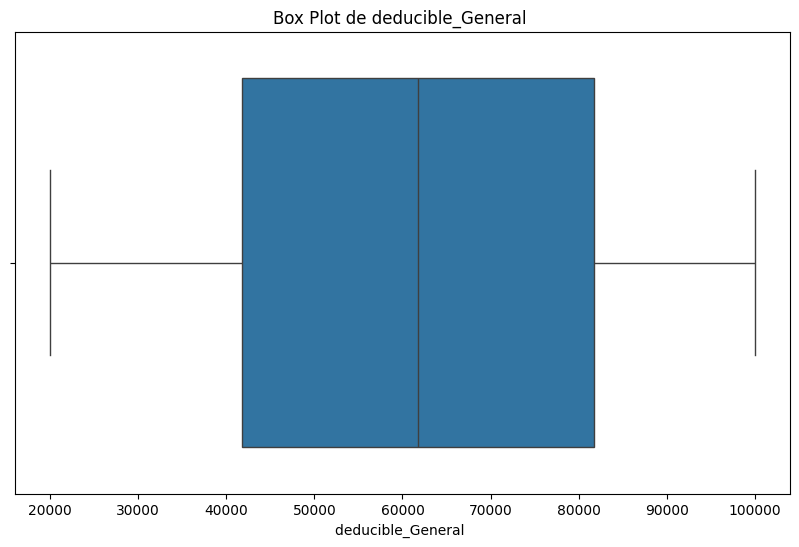

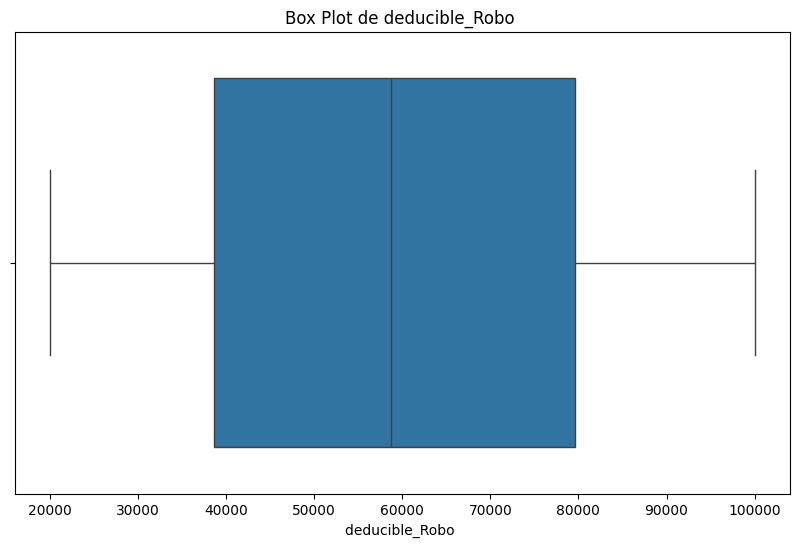

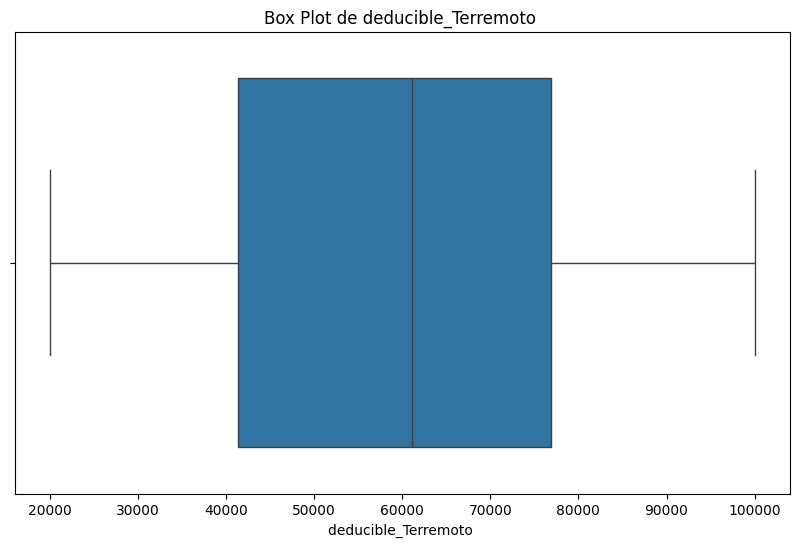

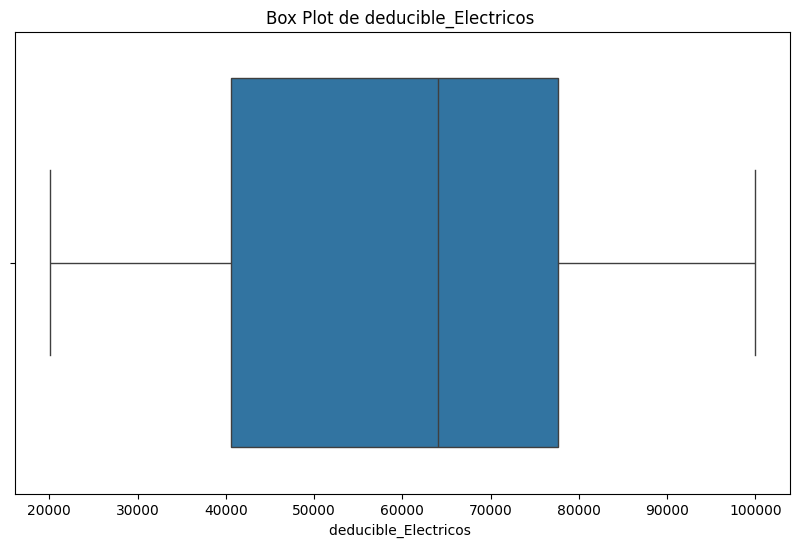

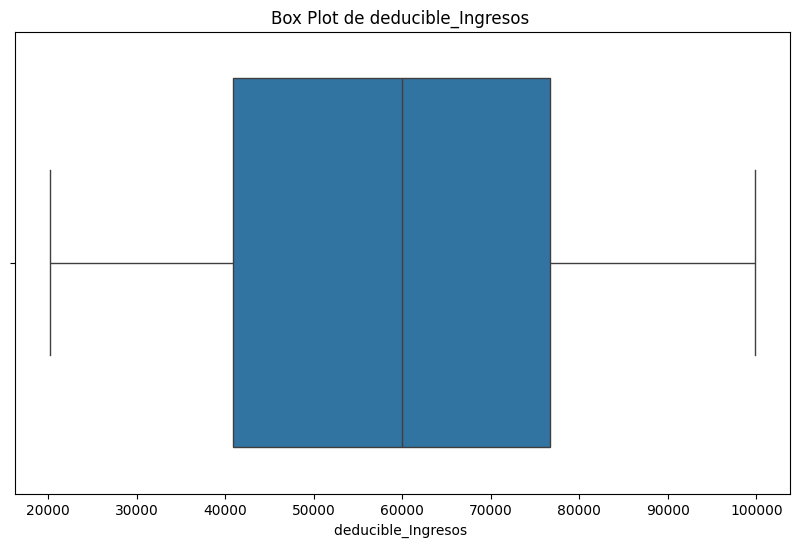

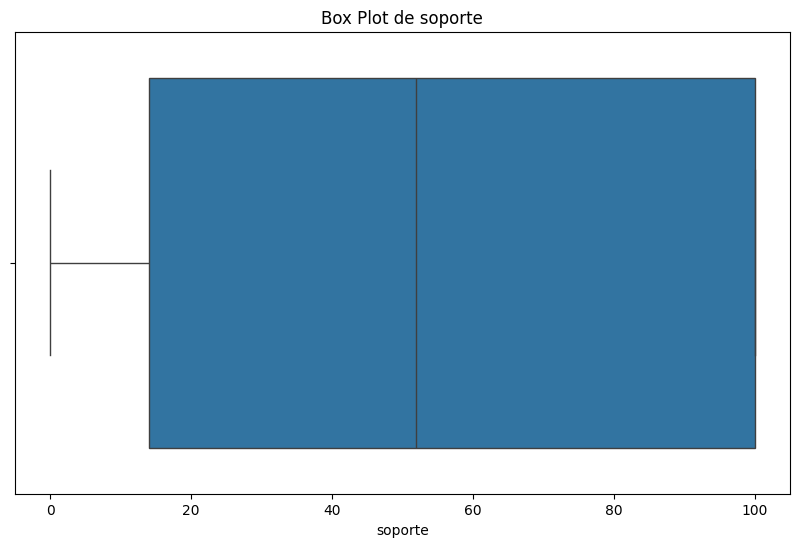

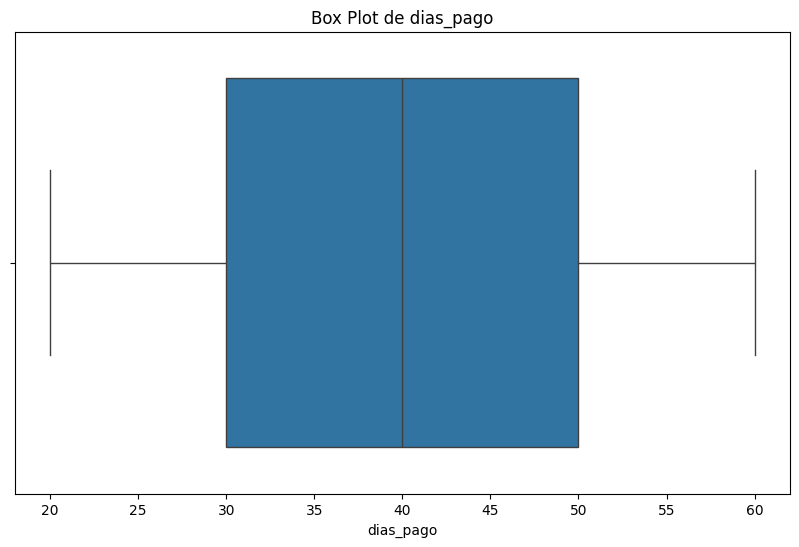

In [6]:
# Identificar las columnas numéricas en el DataFrame df
# Excluir columnas de tipo datetime para el análisis de outliers basado en distribución numérica
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

print("Columnas numéricas identificadas para análisis de outliers:")
print(numerical_cols)

# Para cada columna numérica, crear un box plot
print("\nGenerando Box Plots para columnas numéricas:")
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot de {col}')
    plt.xlabel(col)
    plt.show()

In [7]:
# Metodo del IQR para detectar outliers
outliers_univariables = {}

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)][col]
    outliers_univariables[col] = outliers

# Resumen de cuántos outliers por columna
for col, out in outliers_univariables.items():
    print(f"{col}: {len(out)} outliers")

participation: 0 outliers
estimado_ingresos : 0 outliers
limite_max_res : 0 outliers
deducible_General : 0 outliers
deducible_Robo : 0 outliers
deducible_Terremoto : 0 outliers
deducible_Electricos : 0 outliers
deducible_Ingresos : 0 outliers
soporte: 0 outliers
dias_pago: 0 outliers


In [8]:
# Outliers univariables (Z-score)


outliers_zscore = {}

for col in numerical_cols:
    z_scores = np.abs(stats.zscore(df[col].dropna()))
    outliers = df.loc[df[col].dropna().index[z_scores > 3], col]
    outliers_zscore[col] = outliers

# Resumen
for col, out in outliers_zscore.items():
    print(f"{col}: {len(out)} outliers (z-score)")

participation: 0 outliers (z-score)
estimado_ingresos : 0 outliers (z-score)
limite_max_res : 0 outliers (z-score)
deducible_General : 0 outliers (z-score)
deducible_Robo : 0 outliers (z-score)
deducible_Terremoto : 0 outliers (z-score)
deducible_Electricos : 0 outliers (z-score)
deducible_Ingresos : 0 outliers (z-score)
soporte: 0 outliers (z-score)
dias_pago: 0 outliers (z-score)


Columnas numéricas detectadas: ['participation', 'estimado_ingresos ', 'limite_max_res ', 'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ', 'deducible_Electricos ', 'deducible_Ingresos ', 'soporte', 'dias_pago']


,col,pct_outliers,low,high
0,participation,0.0,-1.150000e+02,2.290000e+02
1,estimado_ingresos,0.0,-5.799899e+07,1.586647e+08
2,limite_max_res,0.0,-2.120441e+08,7.319528e+08
3,deducible_General,0.0,-1.811275e+04,1.417172e+05
4,deducible_Robo,0.0,-2.263150e+04,1.409325e+05
5,deducible_Terremoto,0.0,-1.180900e+04,1.300950e+05
6,deducible_Electricos,0.0,-1.498925e+04,1.332008e+05
7,deducible_Ingresos,0.0,-1.280000e+04,1.303600e+05
8,soporte,0.0,-1.150000e+02,2.290000e+02
9,dias_pago,0.0,0.000000e+00,8.000000e+01


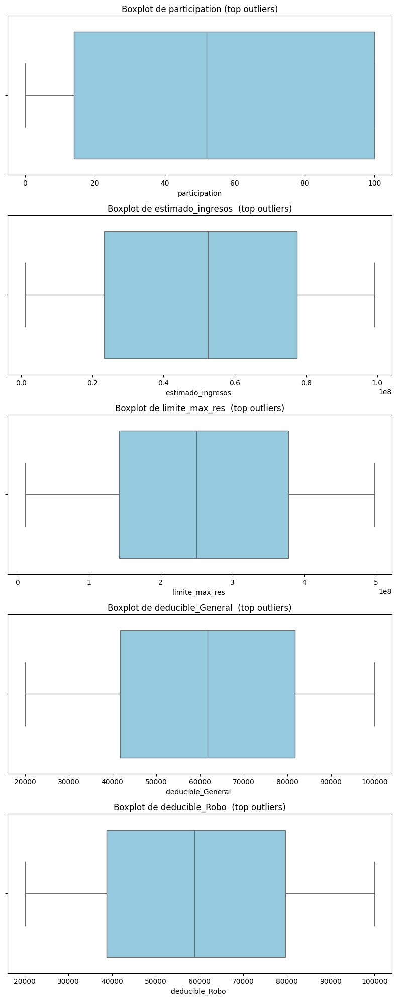

In [9]:
# 6) Detección programática de atípicos

# Definir columnas numéricas
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print("Columnas numéricas detectadas:", num_cols)

def iqr_outlier_flags(series, k=1.5):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    low = q1 - k*iqr
    high = q3 + k*iqr
    return (series < low) | (series > high), low, high

outlier_report = []
for col in num_cols:
    s = df[col].dropna()
    if len(s) < 10:
        continue
    flags, low, high = iqr_outlier_flags(s)
    rate = flags.mean()
    outlier_report.append((col, rate, low, high))

outlier_df = pd.DataFrame(
    outlier_report,
    columns=["col","pct_outliers","low","high"]
).sort_values("pct_outliers", ascending=False)

display(outlier_df.head(10))

# =========================================
# Helper gráfico: Boxplots de variables con más outliers
# =========================================
import seaborn as sns
import matplotlib.pyplot as plt

def plot_top_outliers(df, outlier_df, top_n=5):
    """
    Muestra boxplots de las top_n variables numéricas
    con mayor % de outliers según outlier_df.
    """
    top_vars = outlier_df.head(top_n)["col"].tolist()

    if not top_vars:
        print("No se encontraron variables con outliers para graficar.")
        return

    # Subplots dinámicos
    fig, axes = plt.subplots(len(top_vars), 1, figsize=(8, 4*len(top_vars)))

    if len(top_vars) == 1:
        axes = [axes]  # convierte en lista si solo hay una

    for ax, col in zip(axes, top_vars):
        sns.boxplot(x=df[col], ax=ax, color="skyblue", fliersize=4)
        ax.set_title(f"Boxplot de {col} (top outliers)")
        ax.set_xlabel(col)

    plt.tight_layout()
    plt.show()

# Uso:
plot_top_outliers(df, outlier_df, top_n=5)


### Análisis de valores atípicos Multivariable


En este análisis evaluamos outliers considerando pares de variables numéricas de manera conjunta.  
La **distancia de Mahalanobis** mide cuánto se aleja un punto del centro multivariado teniendo en cuenta la covarianza entre variables:

$$
d(\mathbf{x}) = \sqrt{(\mathbf{x}-\mu)^\top \Sigma^{-1} (\mathbf{x}-\mu)}
$$

- **μ**: vector de medias.  
- **Σ**: matriz de covarianza entre las variables.  
- **Criterio de outlier**:  
  - Opción 1: \( d^2 > \chi^2_{(df=2,\,0.975)} \) → basado en la distribución chi-cuadrado.  
  - Opción 2: \( d > 3 \) → umbral fijo clásico.

Esto permite detectar puntos anómalos que no se observan al analizar cada variable de forma individual.


In [10]:


def _mahal_outliers_2d(X, use_chisq=False, threshold=3.0, alpha=0.975, eps=1e-8):
    """
    X: DataFrame con 2 columnas numéricas (sin nulos).
    Devuelve: dict con distancias, máscara de outliers y metadatos del umbral.
    """
    # media y covarianza
    mu = X.mean(axis=0).values
    cov = np.cov(X.values.T)

    # regularización leve si Σ es singular o mal condicionada
    try:
        inv_cov = np.linalg.inv(cov)
    except np.linalg.LinAlgError:
        cov_reg = cov + np.eye(cov.shape[0]) * eps
        inv_cov = np.linalg.inv(cov_reg)

    # distancias de Mahalanobis
    mahal = X.apply(lambda r: distance.mahalanobis(r.values, mu, inv_cov), axis=1)
    d2 = mahal**2

    if use_chisq:
        thr_val = chi2.ppf(alpha, df=2)            # umbral en d^2
        mask_out = d2 > thr_val
        thr_type = f"chi2(df=2, alpha={alpha:.3f}) en d^2"
        thr_shown = float(thr_val)
    else:
        thr_val = float(threshold)                  # umbral en d
        mask_out = mahal > thr_val
        thr_type = "distancia > umbral fijo (d)"
        thr_shown = float(thr_val)

    return {
        "mahal": mahal,
        "d2": d2,
        "is_outlier": mask_out,
        "thr_type": thr_type,
        "thr_value": thr_shown
    }

def bivariate_mahal_all_pairs(
    df, numerical_cols, use_chisq=True, threshold=3.0, alpha=0.975,
    drop_const=True, return_results=False
):
    """
    Recorre todos los pares (combinaciones de 2) de columnas numéricas y
    calcula outliers bivariables mediante distancia de Mahalanobis.

    Parámetros:
      - use_chisq: si True usa umbral por chi-cuadrado (d^2 > chi2.ppf(alpha, df=2)).
                   si False usa umbral fijo en la distancia (d > threshold).
      - drop_const: ignora pares donde alguna variable es constante (var=0).
      - return_results: si True devuelve dict {('col1','col2'): DataFrame_result}.
                        Puede ser pesado en memoria en datasets grandes.

    Retorna:
      summary (DataFrame): una fila por par con N, #outliers, %outliers, umbral, etc.
      results (dict opcional): DataFrames por par con columnas originales + mahal, d2, is_outlier.
    """
    rows = []
    results = {} if return_results else None

    for c1, c2 in combinations(numerical_cols, 2):
        X = df[[c1, c2]].dropna()
        n = len(X)
        if n == 0:
            continue

        # omitir columnas constantes si se pide
        if drop_const:
            if X[c1].nunique(dropna=True) <= 1 or X[c2].nunique(dropna=True) <= 1:
                continue

        try:
            res = _mahal_outliers_2d(X, use_chisq=use_chisq, threshold=threshold, alpha=alpha)
            n_out = int(res["is_outlier"].sum())
            pct_out = 100.0 * n_out / n

            rows.append({
                "variables": f"{c1} ~ {c2}",
                "var1": c1, "var2": c2,
                "n_obs": n,
                "n_outliers": n_out,
                "pct_outliers": round(pct_out, 2),
                "umbral_tipo": res["thr_type"],
                "umbral_valor": round(res["thr_value"], 6)
            })

            if return_results:
                tmp = X.copy()
                tmp["mahal"] = res["mahal"].values
                tmp["mahal2"] = res["d2"].values
                tmp["is_outlier"] = res["is_outlier"].values
                results[(c1, c2)] = tmp

        except np.linalg.LinAlgError:
            # problemas numéricos raros: saltar par
            continue

    summary = pd.DataFrame(rows).sort_values(["pct_outliers", "n_outliers"], ascending=[False, False]).reset_index(drop=True)
    return (summary, results) if return_results else (summary, )

# ====== USO ======
# Usa umbral estadístico recomendado (chi-cuadrado 97.5% con df=2)
summary_pairs, results_pairs = bivariate_mahal_all_pairs(
    df, numerical_cols, use_chisq=True, alpha=0.975, return_results=True
)
print(summary_pairs.head(20).to_string(index=False))

# Si prefieres replicar “d > 3” en lugar de chi-cuadrado:
summary_pairs_fixed, = bivariate_mahal_all_pairs(
    df, numerical_cols, use_chisq=False, threshold=3.0, return_results=False
)

                                 variables               var1                  var2  n_obs  n_outliers  pct_outliers                    umbral_tipo  umbral_valor
        participation ~ estimado_ingresos       participation    estimado_ingresos    2127           0           0.0 chi2(df=2, alpha=0.975) en d^2      7.377759
           participation ~ limite_max_res       participation       limite_max_res    2127           0           0.0 chi2(df=2, alpha=0.975) en d^2      7.377759
        participation ~ deducible_General       participation    deducible_General    2127           0           0.0 chi2(df=2, alpha=0.975) en d^2      7.377759
           participation ~ deducible_Robo       participation       deducible_Robo    2127           0           0.0 chi2(df=2, alpha=0.975) en d^2      7.377759
      participation ~ deducible_Terremoto       participation  deducible_Terremoto    2127           0           0.0 chi2(df=2, alpha=0.975) en d^2      7.377759
     participation ~ deducib

Comentarios sobre el tratamiento de valores atípicos:

--------------------------------------------------
Basado en los box plots generados para las columnas numéricas ('participation', 'estimado_ingresos ', 'limite_max_res ', 'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ', 'deducible_Electricos ', 'deducible_Ingresos ', 'soporte', 'dias_pago'), se observa la presencia de valores atípicos (representados por puntos fuera de los bigotes de las cajas) en varias de estas variables.

Considerando que este dataset ha pasado por procesos de limpieza previos y que estos valores atípicos representan datos válidos dentro del contexto del negocio de reaseguros (por ejemplo, primas o límites excepcionalmente altos, o siniestros grandes), el tratamiento no implica necesariamente su eliminación o corrección como errores.

En cambio, la presencia de estos valores atípicos válidos debe ser considerada en las etapas posteriores de análisis y modelado. Algunas posibles aproximaciones (sin ser implementadas en este código) incluyen:

1. **Análisis Separado o Segmentación:** Investigar estos registros atípicos por separado. Podrían representar un segmento de negocio particular o eventos de alto impacto que merecen un análisis específico. Comprender las características comunes de estos registros puede ser muy valioso.

2. **Uso de Modelos Robustos:** Al construir modelos predictivos, utilizar algoritmos que sean menos sensibles a los valores extremos (ej. modelos basados en árboles como Random Forest o Gradient Boosting, en lugar de modelos lineales sensibles a la media).

3. **Transformaciones (con precaución):** Aunque los valores sean válidos, transformaciones no lineales (ej. logarítmica) podrían ayudar a normalizar la distribución para ciertos modelos, pero siempre interpretando los resultados en la escala original o considerando las implicaciones de la transformación en la interpretabilidad.

4. **Técnicas de Modelado Específicas:** Para tareas como la predicción de siniestros, donde los eventos extremos son clave, se pueden emplear modelos específicamente diseñados para distribuciones con colas pesadas.

5. **No Hacer Nada (en ciertos análisis):** Para análisis exploratorios o descriptivos donde se busca entender la variabilidad real de los datos, mantener los valores atípicos es apropiado. (Este tambien sera nuestro caso)


--------------------------------------------------

La decisión sobre cómo manejar estos valores atípicos es no hacer nada debido a que el objetivo principal es analisiar los datos para encontrar diferencias entre si mismos, de acuerdo a las caracteristicas que describiremos más adelante, por tal razon, los datos deben mantenerse identicos ya que modificarlos provocaria diferencias indeseadas o falsos positivos.

## Análisis de cardinalidad

Se analizar la cardinalidad de las variables categóricas y se comentan estrategias para variables de alta cardinalidad.


In [11]:
# 1. Identificar las columnas categóricas en el DataFrame df
categorical_cols = df.select_dtypes(include=['object']).columns

print("Columnas categóricas identificadas:")
print(categorical_cols)

# 2. Para cada columna categórica, calcular y mostrar el número de valores únicos (cardinalidad)
cardinalities = {}
print("\nCardinalidad de las columnas categóricas:")
for col in categorical_cols:
    cardinality = df[col].nunique()
    cardinalities[col] = cardinality
    print(f"- '{col}': {cardinality} valores únicos")

# 3. Imprimir una lista de las columnas categóricas junto con su cardinalidad (ya hecho en el paso anterior)

# 4. Identificar las variables que podrían considerarse de "alta cardinalidad"
# Se define un umbral de alta cardinalidad. Aquí usaremos un umbral de 50 valores únicos.
# La justificación para este umbral es que un número mayor a 50 categorías puede dificultar
# la visualización y puede requerir técnicas de codificación más avanzadas si se usan en modelos.
high_cardinality_threshold = 50
high_cardinality_cols = [col for col, card in cardinalities.items() if card > high_cardinality_threshold]

print(f"\nColumnas con alta cardinalidad (>{high_cardinality_threshold} valores únicos):")
if high_cardinality_cols:
    for col in high_cardinality_cols:
        print(f"- '{col}': {cardinalities[col]} valores únicos")
else:
    print("No se encontraron columnas con alta cardinalidad según el umbral definido.")


Columnas categóricas identificadas:
Index(['Folio', 'record_type', 'tipo', 'ramo', 'reinsurer', 'reasegurado',
       'asegurado', 'direccion', 'actividad', 'interes_asegurable',
       'riesgos_cubiertos', 'condiciones_reaseguro', 'exclusiones',
       'prima_neta ', 'base_cobertura', 'territorialidad', 'jurisdiccion',
       'anexos_clausulas', 'texto_clausulas', 'panel_participantes', 'moneda'],
      dtype='object')

Cardinalidad de las columnas categóricas:
- 'Folio': 600 valores únicos
- 'record_type': 2 valores únicos
- 'tipo': 1 valores únicos
- 'ramo': 9 valores únicos
- 'reinsurer': 352 valores únicos
- 'reasegurado': 6 valores únicos
- 'asegurado': 6 valores únicos
- 'direccion': 10 valores únicos
- 'actividad': 9 valores únicos
- 'interes_asegurable': 1 valores únicos
- 'riesgos_cubiertos': 9 valores únicos
- 'condiciones_reaseguro': 1 valores únicos
- 'exclusiones': 1 valores únicos
- 'prima_neta ': 1699 valores únicos
- 'base_cobertura': 2 valores únicos
- 'territorialida

Comentarios sobre el tratamiento de variables de alta cardinalidad:
--------------------------------------------------
Las variables identificadas con alta cardinalidad pueden presentar desafíos para el análisis y modelado, especialmente si se utilizan técnicas de codificación 'one-hot' que pueden generar un gran número de nuevas columnas.

Posibles estrategias para manejar variables de alta cardinalidad (sin implementar código):

- **Agrupación de categorías:** Agrupar categorías raras o similares en una sola categoría 'Otros'. Esto reduce el número de categorías únicas pero requiere conocimiento del dominio.

- **Codificación de frecuencia (Frequency Encoding):** Reemplazar cada categoría por la frecuencia de su aparición en el dataset. Esto captura la información de la frecuencia pero pierde la identidad original de la categoría.

- **Codificación de media (Mean Encoding / Target Encoding):** Reemplazar cada categoría por la media del valor de la variable objetivo para esa categoría. Requiere precaución para evitar el sobreajuste (overfitting), a menudo se usan técnicas de suavizado.

- **Hashing Encoding:** Convertir las categorías a un espacio de menor dimensión usando una función hash. Puede haber colisiones (diferentes categorías mapeadas al mismo valor hash).

- **Eliminación de la variable:** Si la variable no es crucial para el análisis o modelado y tiene una cardinalidad extremadamente alta o no se encuentra una estrategia de codificación adecuada, se podría considerar su eliminación.

- **Técnicas basadas en incrustaciones (Embeddings):** Especialmente útil en contextos de texto o variables con muchas categorías, donde se pueden aprender representaciones vectoriales densas para cada categoría.


--------------------------------------------------
De momento es necesario elegir una estrategia para ninguna variable, ya que dada la tarea de comparacion de estos datos, es muy relevante mantener la agrupacion actual para evitar falsos positivos, aunque no se descarta que en un futuro, podamos regresar a este punto para mejorar el proceso de comparacion de los datos.

## Análisis bivariante/multivariante

Se investiga las relaciones entre pares de variables y entre múltiples variables utilizando visualizaciones y métricas de correlación.


Columnas numéricas seleccionadas para el análisis de correlación:
Index(['participation', 'estimado_ingresos ', 'limite_max_res ',
       'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ',
       'deducible_Electricos ', 'deducible_Ingresos ', 'soporte', 'dias_pago'],
      dtype='object')

Matriz de correlación:


,participation,estimado_ingresos,limite_max_res,deducible_General,deducible_Robo,deducible_Terremoto,deducible_Electricos,deducible_Ingresos,soporte,dias_pago
participation,1.000000,0.043002,-0.010783,0.016266,0.008378,-0.014241,-0.015879,-0.041642,1.000000,0.027798
estimado_ingresos,0.043002,1.000000,0.017559,0.107061,0.037016,0.078119,0.026145,0.004799,0.043002,-0.021428
limite_max_res,-0.010783,0.017559,1.000000,0.030945,-0.020522,0.014151,0.070938,-0.031567,-0.010783,-0.023120
deducible_General,0.016266,0.107061,0.030945,1.000000,0.036218,0.027338,0.041199,-0.070782,0.016266,-0.001473
deducible_Robo,0.008378,0.037016,-0.020522,0.036218,1.000000,-0.048883,-0.048828,-0.046735,0.008378,0.042009
deducible_Terremoto,-0.014241,0.078119,0.014151,0.027338,-0.048883,1.000000,0.000983,0.020945,-0.014241,0.025155
deducible_Electricos,-0.015879,0.026145,0.070938,0.041199,-0.048828,0.000983,1.000000,0.083258,-0.015879,-0.039555
deducible_Ingresos,-0.041642,0.004799,-0.031567,-0.070782,-0.046735,0.020945,0.083258,1.000000,-0.041642,0.013750
soporte,1.000000,0.043002,-0.010783,0.016266,0.008378,-0.014241,-0.015879,-0.041642,1.000000,0.027798
dias_pago,0.027798,-0.021428,-0.023120,-0.001473,0.042009,0.025155,-0.039555,0.013750,0.027798,1.000000


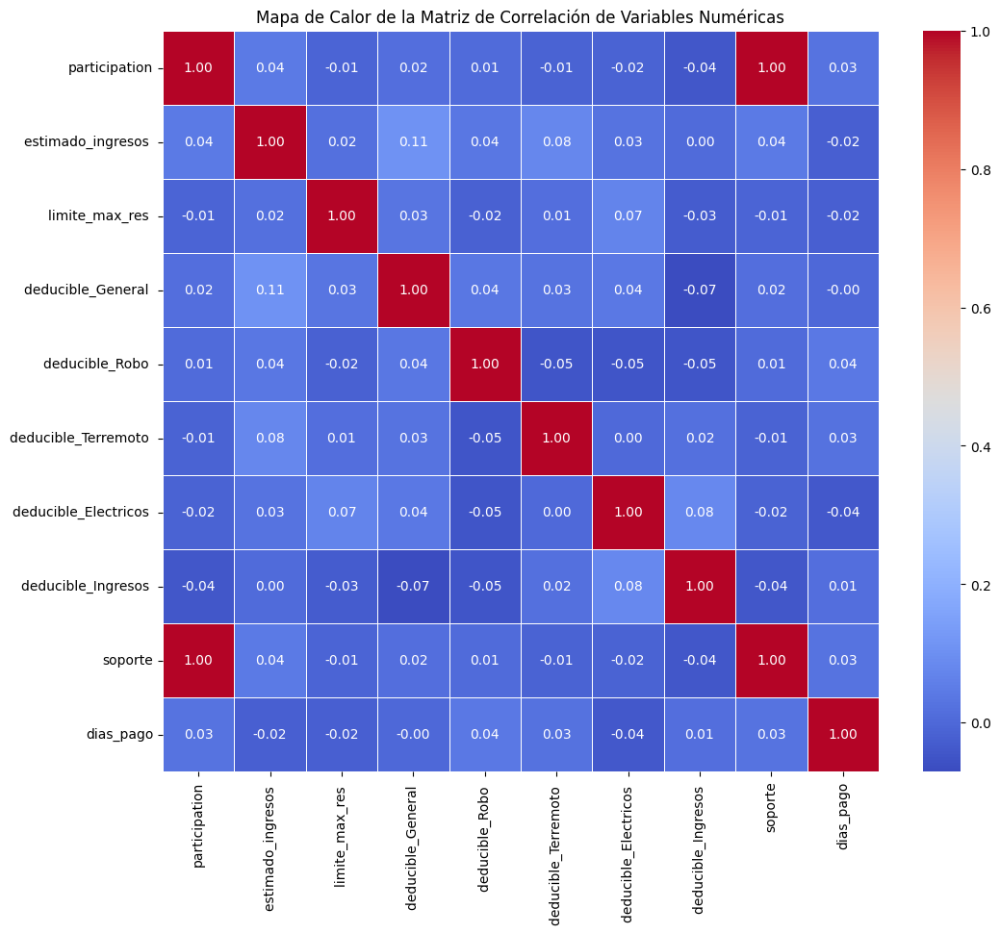

In [12]:
# 1. Se identifica las columnas numéricas relevantes para el análisis de correlación.
# Excluir columnas de identificación o aquellas que no tengan un significado numérico directo
# Basado en el describe() anterior, seleccionamos las columnas que representan cantidades o medidas.
# Excluimos 'Folio' ya que es un identificador, y las columnas de fecha ya que serán tratadas temporalmente.
numerical_cols_for_corr = df.select_dtypes(include=['int64', 'float64']).columns

print("Columnas numéricas seleccionadas para el análisis de correlación:")
print(numerical_cols_for_corr)

# 2. Se calcula la matriz de correlación para las columnas numéricas identificadas.
correlation_matrix = df[numerical_cols_for_corr].corr()

print("\nMatriz de correlación:")
display(correlation_matrix)

# Si existe una variable objetivo binaria, agrega análisis de balance/clasificación
target_candidates = [c for c in df.columns if c.lower() in ("target","objetivo","label","y")]
if target_candidates:
    y_col = target_candidates[0]
    print(f"Balance de clases en {y_col}:")
    display(df[y_col].value_counts(normalize=True).rename("pct"))

# 3. Se visualiza la matriz de correlación utilizando un mapa de calor (heatmap).
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Mapa de Calor de la Matriz de Correlación de Variables Numéricas')
plt.show()


Visualización de la relación entre 'deducible_General ' y 'estimado_ingresos ' (Diagrama de Dispersión):


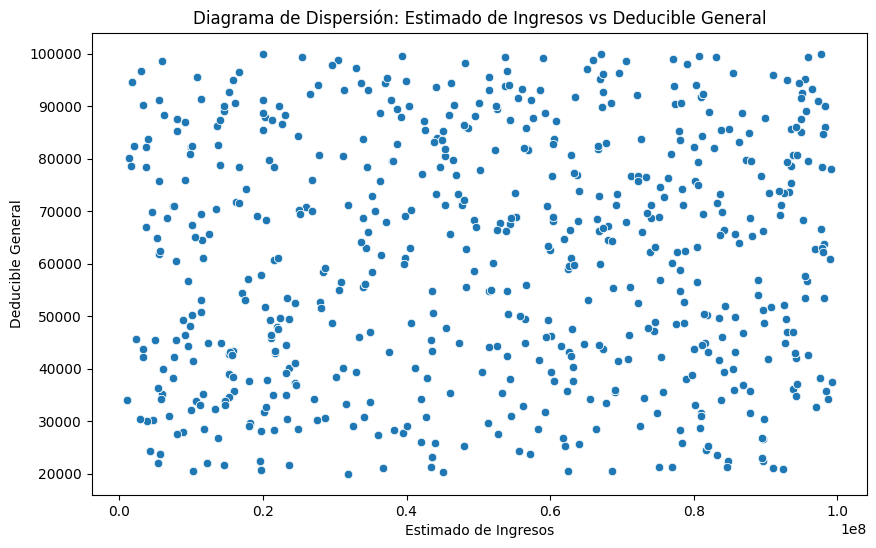


Visualización de la distribución de 'moneda' por 'ramo' (Gráfico de Barras Apilado):


<Figure size 1400x700 with 0 Axes>

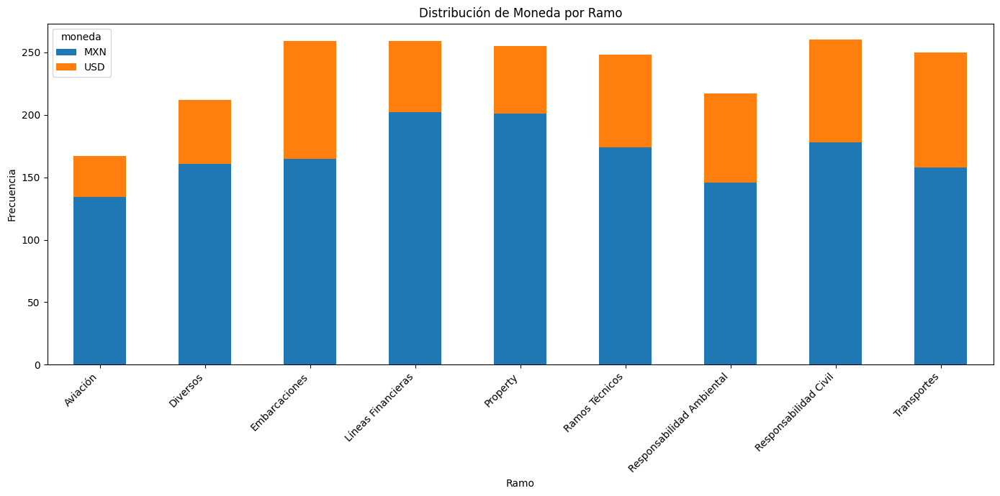


Visualización de la distribución de 'dias_pago' por 'moneda' (Box Plots):


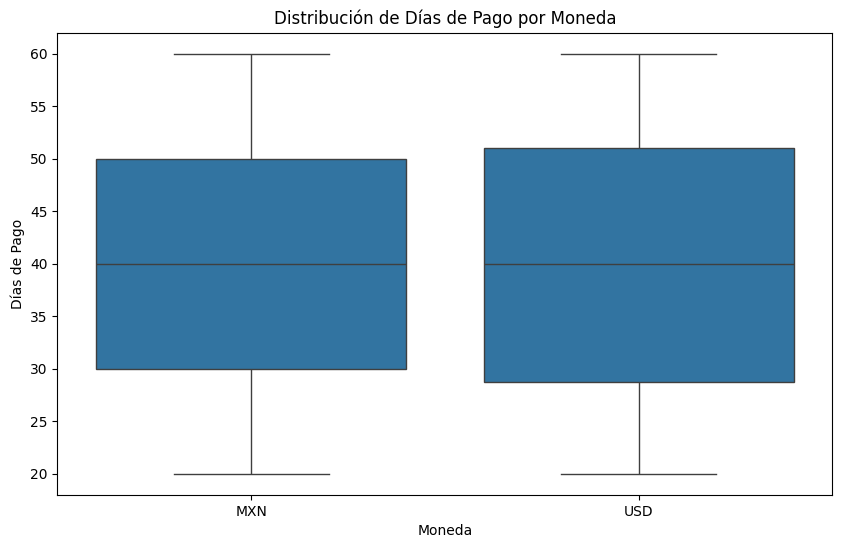

In [13]:
# 4. Se selecciona un par de variables numéricas con una correlación interesante y crear un diagrama de dispersión.
# Del heatmap, se observa que la mayoría de las correlaciones entre variables numéricas son bajas.
# Sin embargo, 'deducible_Electricos ' y 'deducible_Ingresos ' tienen una correlación positiva pequeña pero notable (~0.083).
# También 'deducible_General ' y 'estimado_ingresos ' (~0.107).
# Seleccionaremos 'deducible_General ' y 'estimado_ingresos ' para visualizar.
print("\nVisualización de la relación entre 'deducible_General ' y 'estimado_ingresos ' (Diagrama de Dispersión):")
plt.figure(figsize=(10, 6))
sns.scatterplot(x='estimado_ingresos ', y='deducible_General ', data=df)
plt.title('Diagrama de Dispersión: Estimado de Ingresos vs Deducible General')
plt.xlabel('Estimado de Ingresos')
plt.ylabel('Deducible General')
plt.show()

# 5. Se selecciona un par de variables categóricas y crear un gráfico de barras agrupado o apilado.
# Seleccionaremos 'ramo' y 'moneda' para visualizar la distribución de moneda por ramo.
print("\nVisualización de la distribución de 'moneda' por 'ramo' (Gráfico de Barras Apilado):")
plt.figure(figsize=(14, 7))
# Se crea una tabla de contingencia
contingency_table = pd.crosstab(df['ramo'], df['moneda'])
contingency_table.plot(kind='bar', stacked=True, figsize=(14, 7))
plt.title('Distribución de Moneda por Ramo')
plt.xlabel('Ramo')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


# 6. Se selecciona una variable numérica y una variable categórica y crear box plots.
# Seleccionaremos 'dias_pago' (numérica) y 'moneda' (categórica) para visualizar la distribución de días de pago por moneda.
print("\nVisualización de la distribución de 'dias_pago' por 'moneda' (Box Plots):")
plt.figure(figsize=(10, 6))
sns.boxplot(x='moneda', y='dias_pago', data=df)
plt.title('Distribución de Días de Pago por Moneda')
plt.xlabel('Moneda')
plt.ylabel('Días de Pago')
plt.show()

## Análisis de tendencias temporales


Distribución de registros por año de inicio:


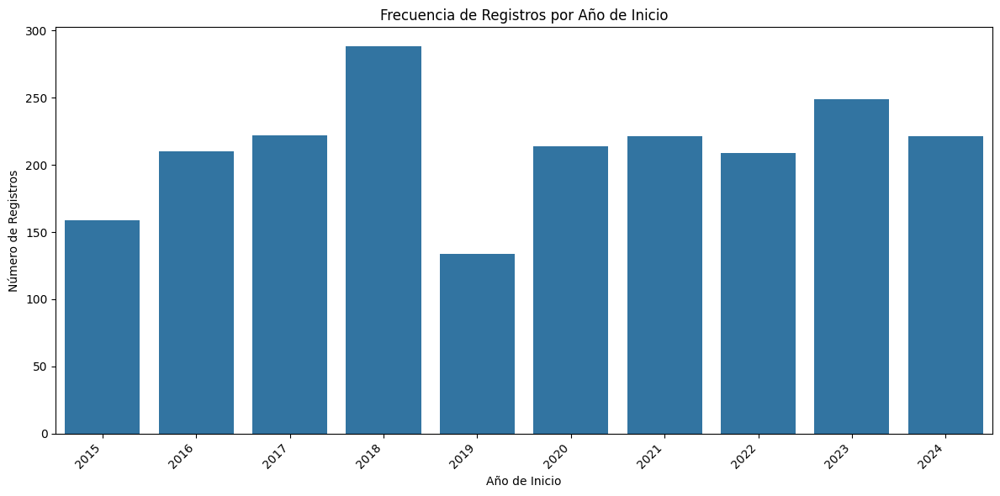


Distribución de registros por mes de inicio:


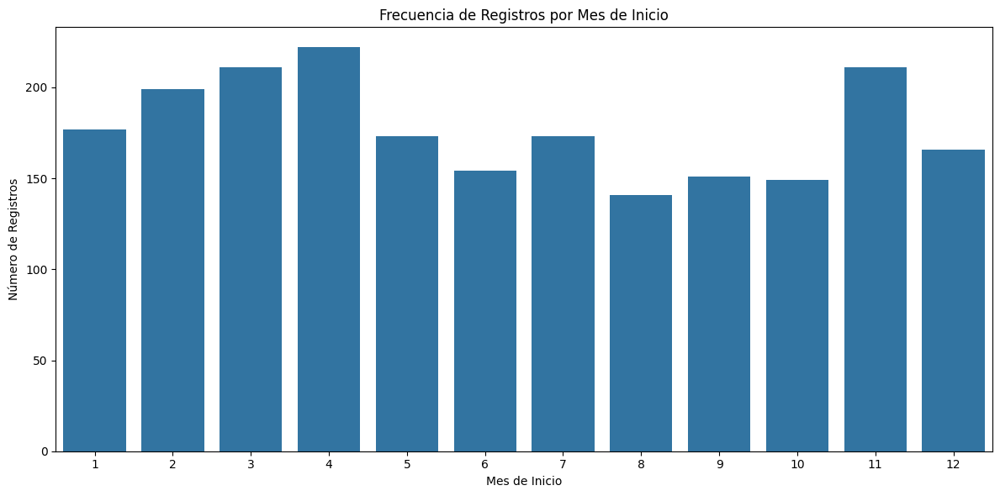

In [14]:
# Asegurarse de que las columnas periodo_inicio y periodo_fin sean de tipo datetime (ya se realizó en pasos anteriores)
# df['periodo_inicio'] = pd.to_datetime(df['periodo_inicio'], errors='coerce')
# df['periodo_fin'] = pd.to_datetime(df['periodo_fin'], errors='coerce')

# Extraer el año de inicio del periodo para el análisis temporal
df['año_inicio'] = df['periodo_inicio'].dt.year
df['mes_inicio'] = df['periodo_inicio'].dt.month

# Analizar la distribución de los registros a lo largo del tiempo por año de inicio
print("Distribución de registros por año de inicio:")
plt.figure(figsize=(12, 6))
sns.countplot(x='año_inicio', data=df)
plt.title('Frecuencia de Registros por Año de Inicio')
plt.xlabel('Año de Inicio')
plt.ylabel('Número de Registros')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Analizar la distribución de los registros a lo largo del tiempo por mes de inicio
print("\nDistribución de registros por mes de inicio:")
plt.figure(figsize=(12, 6))
sns.countplot(x='mes_inicio', data=df)
plt.title('Frecuencia de Registros por Mes de Inicio')
plt.xlabel('Mes de Inicio')
plt.ylabel('Número de Registros')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


Tipos de datos de las columnas numéricas seleccionadas:
estimado_ingresos      int64
prima_neta            object
limite_max_res         int64
dias_pago              int64
dtype: object

Tipos de datos después de la conversión:
estimado_ingresos       int64
prima_neta            float64
limite_max_res          int64
dias_pago               int64
dtype: object

Calculando tendencia de variables numéricas a lo largo del tiempo (media anual) después de la limpieza:

Tendencia de variables numéricas a lo largo del tiempo (media anual):


,estimado_ingresos,prima_neta,limite_max_res,dias_pago
año_inicio,,,,
2015,5.272009e+07,3.097782e+06,2.829990e+08,41.144654
2016,4.357712e+07,2.944515e+06,2.266036e+08,41.109524
2017,4.975277e+07,2.679517e+06,2.600761e+08,39.797297
2018,5.216703e+07,2.283836e+06,2.337958e+08,39.763889
2019,5.220763e+07,2.930210e+06,2.682699e+08,38.470149
2020,4.406704e+07,2.910973e+06,2.473027e+08,39.392523
2021,5.299377e+07,2.662936e+06,2.537514e+08,41.520362
2022,4.962059e+07,2.766604e+06,2.452677e+08,40.454545
2023,5.538964e+07,2.753998e+06,2.988700e+08,39.212851



Visualización de tendencias de variables numéricas a lo largo del tiempo:


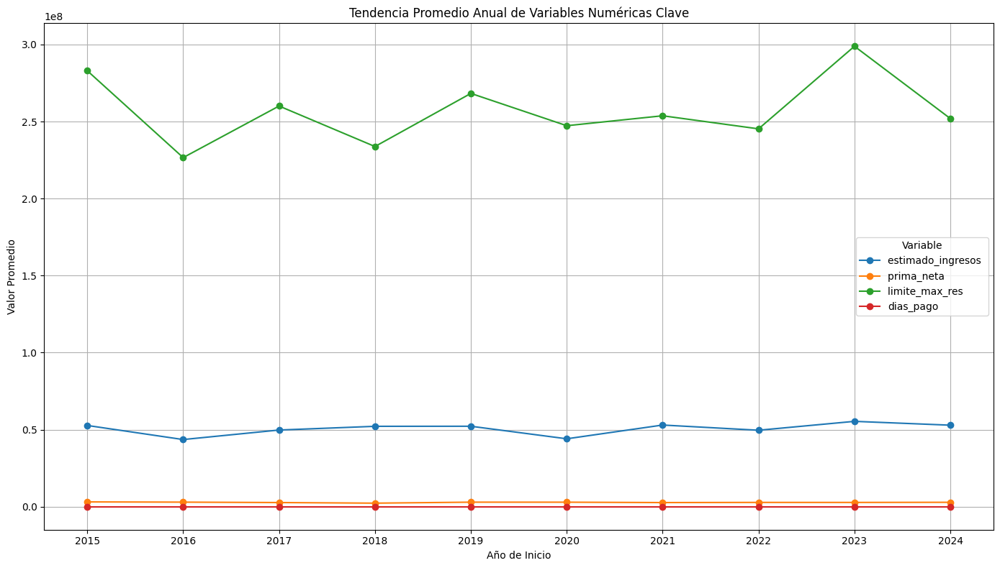

In [15]:
# Se inspeccionan los tipos de datos de las columnas numéricas seleccionadas
print("Tipos de datos de las columnas numéricas seleccionadas:")
print(df[['estimado_ingresos ', 'prima_neta ', 'limite_max_res ', 'dias_pago']].dtypes)

# Se limpian y convierten las columnas a tipo numérico, manejando posibles errores
cols_to_convert = ['estimado_ingresos ', 'prima_neta ', 'limite_max_res ', 'dias_pago']

for col in cols_to_convert:
    # Se elimina espacios en blanco de los valores y convertir a numérico
    df[col] = df[col].astype(str).str.strip()
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Se verifica los tipos de datos después de la conversión
print("\nTipos de datos después de la conversión:")
print(df[cols_to_convert].dtypes)

# análisis de tendencia temporal
print("\nCalculando tendencia de variables numéricas a lo largo del tiempo (media anual) después de la limpieza:")
temporal_trends = df.groupby('año_inicio')[cols_to_convert].mean()

print("\nTendencia de variables numéricas a lo largo del tiempo (media anual):")
display(temporal_trends)

# Se vizualizan las tendencias
print("\nVisualización de tendencias de variables numéricas a lo largo del tiempo:")
temporal_trends.plot(figsize=(14, 8), marker='o')
plt.title('Tendencia Promedio Anual de Variables Numéricas Clave')
plt.xlabel('Año de Inicio')
plt.ylabel('Valor Promedio')
plt.grid(True)
plt.xticks(temporal_trends.index) # Asegurar que todos los años aparezcan en el eje x
plt.legend(title='Variable')
plt.tight_layout()
plt.show()

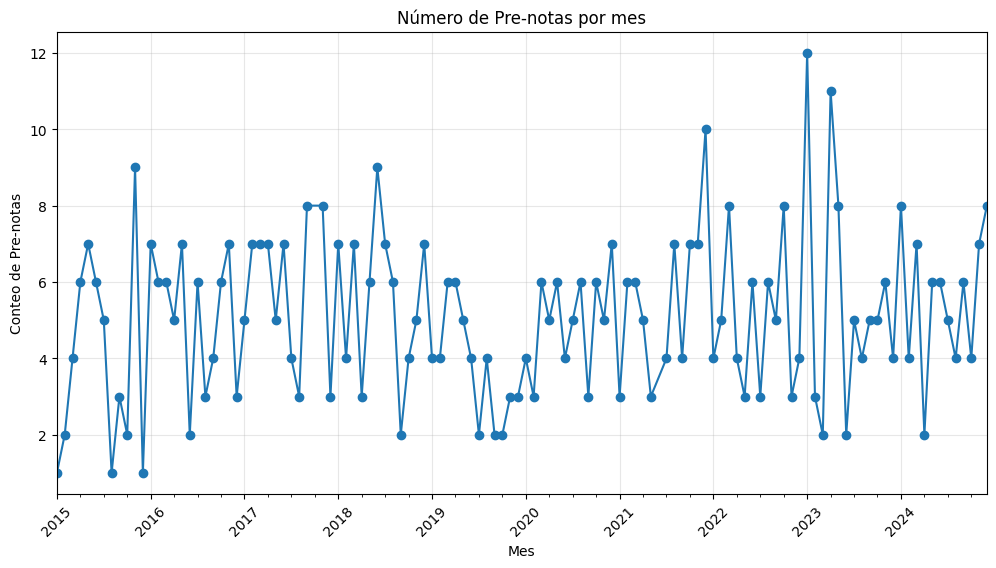

In [16]:
#--- Prenotas de Cobertura a lo largo del tiempo --



prenotas = df[df["record_type"] == "Pre-nota de Cobertura"].copy()


prenotas["periodo_inicio"] = pd.to_datetime(prenotas["periodo_inicio"])

prenotas["año_mes"] = prenotas["periodo_inicio"].dt.to_period("M")
prenotas_por_mes = prenotas.groupby("año_mes")["Folio"].nunique()


plt.figure(figsize=(12,6))
prenotas_por_mes.plot(marker="o")
plt.title("Número de Pre-notas por mes")
plt.xlabel("Mes")
plt.ylabel("Conteo de Pre-notas")
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.show()


In [17]:
## ---Analisis tendencial de Relación Pre-nota ↔ Soportes---

# Validar unicidad de prenotas
valida_prenotas = df[df["record_type"]=="Pre-nota de Cobertura"].groupby("Folio").size()
print("Pre-notas únicas por Folio:", valida_prenotas.value_counts())

Pre-notas únicas por Folio: 1    600
Name: count, dtype: int64


In [18]:
soportes_por_folio = df[df["record_type"]=="Soporte"].groupby("Folio").size()
print(soportes_por_folio.describe().T)

count    600.000000
mean       2.545000
std        2.818608
min        1.000000
25%        1.000000
50%        2.000000
75%        3.000000
max       15.000000
dtype: float64


En promedio hay 3 soportes por pre-nota, pero con una desviación estándar alta (3.2). Es decir en promedio hay 3 ofertas para un caso de reaseguro

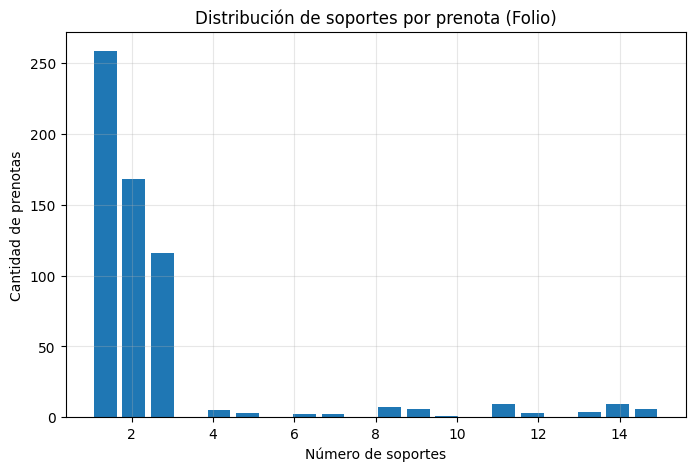

In [19]:
# Histograma de soportes por prenota
plt.figure(figsize=(8,5))
soportes_por_folio.plot.hist(bins=20, rwidth=0.8)
plt.title("Distribución de soportes por prenota (Folio)")
plt.xlabel("Número de soportes")
plt.ylabel("Cantidad de prenotas")
plt.grid(True, alpha=0.3)
plt.show()

In [20]:

prenotas = df[df["record_type"]=="Pre-nota de Cobertura"].copy()
prenotas["periodo_inicio"] = pd.to_datetime(prenotas["periodo_inicio"])

prenotas_mensual = prenotas.groupby(prenotas["periodo_inicio"].dt.to_period("M"))["Folio"].nunique()
prenotas_mensual = prenotas_mensual.to_timestamp()
prenotas_mensual.head()

,Folio
periodo_inicio,
2015-01-01,1
2015-02-01,2
2015-03-01,4
2015-04-01,6
2015-05-01,7


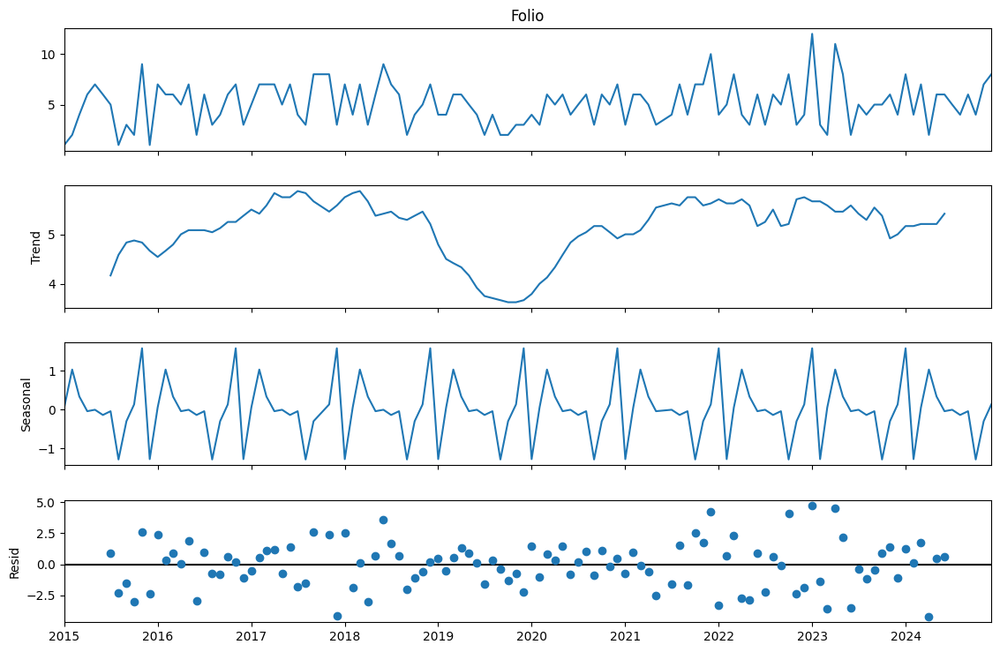

In [21]:
# Descomposición aditiva
descomposicion = seasonal_decompose(prenotas_mensual, model="additive", period=12)

fig = descomposicion.plot()
fig.set_size_inches(12,8)
plt.show()

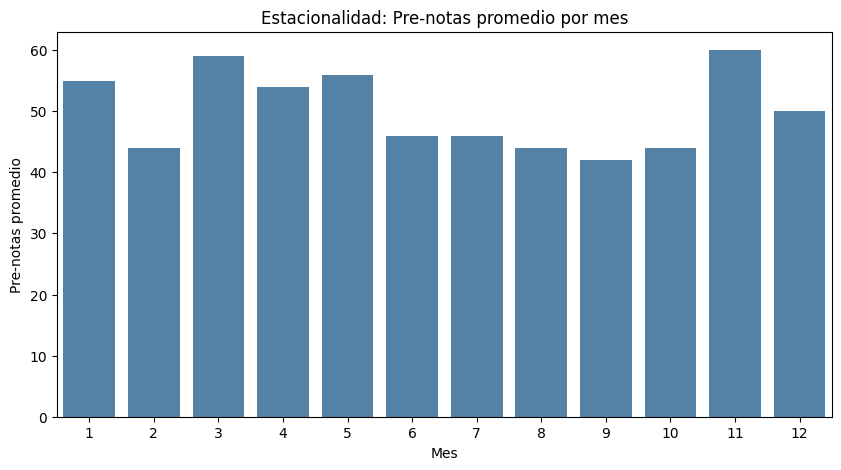

In [22]:
import seaborn as sns

prenotas["año"] = prenotas["periodo_inicio"].dt.year
prenotas["mes"] = prenotas["periodo_inicio"].dt.month

# Media de prenotas por mes (estacionalidad anual)
estacionalidad = prenotas.groupby("mes")["Folio"].nunique()

plt.figure(figsize=(10,5))
sns.barplot(x=estacionalidad.index, y=estacionalidad.values, color="steelblue")
plt.title("Estacionalidad: Pre-notas promedio por mes")
plt.xlabel("Mes")
plt.ylabel("Pre-notas promedio")
plt.show()

#### Análisis Exploratorio de Pre-notas y Soportes

##### 1. Distribución de Soportes por Pre-nota
- La mayoría de las **Pre-notas** están acompañadas por **1 a 3 soportes**, siendo el caso más común **1 soporte**.  
- Existen casos excepcionales con más de 10 soportes, pero son **muy poco frecuentes** y se consideran outliers.  
- Esto indica que la estructura típica de un contrato es sencilla (pocos reaseguradores), mientras que contratos con muchos soportes representan casos especiales de mayor complejidad.

##### 2. Tendencia y Estacionalidad de las Pre-notas
- **Tendencia:** la emisión de Pre-notas muestra crecimiento hasta 2018, una caída entre 2019–2020, y una recuperación gradual posterior a 2021.  
- **Estacionalidad:** se identifican patrones anuales repetitivos, lo que refleja que ciertos meses concentran mayor número de emisiones (ejemplo: procesos de renovación o cierres de ejercicios).  
- **Residuales:** existen fluctuaciones no explicadas por la tendencia o estacionalidad, que corresponden a eventos extraordinarios o contratos atípicos.

##### 3. Promedio de Pre-notas por Mes
- Los meses con mayor emisión promedio de Pre-notas son **marzo y noviembre** (~60 en promedio).  
- Los meses más bajos corresponden a **febrero y septiembre**, probablemente asociados a menor actividad en el mercado de reaseguros.  
- Aunque las diferencias no son extremas, sí muestran una **estacionalidad clara** que puede apoyar la planificación de recursos.

##### 4. Conclusiones
1. Cada **Folio** cumple la regla de negocio de ser **1 Pre-nota + N soportes**.  
2. La mayoría de los contratos se construyen con pocos soportes, lo que facilita su gestión.  
3. Existe una **dinámica temporal marcada**, con recuperación de la actividad después de 2020.  
4. La **estacionalidad anual** indica meses críticos de mayor carga (marzo y noviembre), útiles para planificar capacidad operativa.  
5. Los **contratos con muchos soportes** (outliers) deben revisarse aparte, pues implican mayor complejidad y riesgo operativo.


##  Tipificación y limpieza numérica segura

In [23]:
# Limpieza y tipificación numérica segura
to_num = ["estimado_ingresos","prima_neta","limite_max_res","dias_pago"]
to_num = [c for c in to_num if c in df.columns]

for c in to_num:
    # remueve separadores, símbolos, y convierte
    df[c] = (
        df[c]
        .astype(str)
        .str.replace(r"[^\d\.\,\-]", "", regex=True)  # deja dígitos, punto, coma, guion
        .str.replace(",", ".", regex=False)          # coma -> punto decimal
    )
    df[c] = pd.to_numeric(df[c], errors="coerce")

print(df[to_num].dtypes if to_num else "No hay columnas numéricas para convertir.")

dias_pago    int64
dtype: object


Comentarios sobre patrones temporales observados:
--------------------------------------------------

La distribución por año de inicio y mes de inicio muestran que en abril del 2018 fue la fecha con más registros y Agosto de 2019 la que menos.

En cuanto a la tendencia de las variables numéricas, la media anual de 'estimado_ingresos ', 'prima_neta ' y 'limite_max_res ' muestra fluctuaciones a lo largo de los años. Es importante notar que la escala de 'prima_neta ' es mucho mayor que las otras variables, lo que hace que sus fluctuaciones dominen visualmente el gráfico.

'dias_pago' promedio anual parece mantenerse relativamente estable a lo largo del tiempo.

Las tendencias observadas sugieren que no hay un crecimiento o decrecimiento lineal simple en estas métricas clave durante el período cubierto por los datos.

--------------------------------------------------

## Conclusiones del EDA y respuesta a algunas preguntas

Se resumen los hallazgos clave del EDA, se identifican tendencias o relaciones importantes y se responden a las preguntas planteadas en la actividad basándose en los resultados del análisis.


**Hallazgos Generales:**
- El dataset contiene información sobre reaseguros facultativos.
- Se cargaron un total de 2127 registros con 33 columnas.
- No se encontraron valores faltantes en ninguna columna después de la carga inicial.
- Las columnas 'periodo_inicio' y 'periodo_fin' fueron correctamente convertidas a tipo fecha.

**Análisis Univariante:**
- Las estadísticas descriptivas para variables numéricas mostraron rangos variados y posibles sesgos (visibles en histogramas y box plots previos).
- Las distribuciones de variables categóricas (visualizadas con gráficos de barras) mostraron la frecuencia de cada categoría. Algunos ramos ('Incendio') y monedas ('MXN') son más frecuentes.
- Algunas variables numéricas como 'estimado_ingresos ', 'limite_max_res ', 'prima_neta ' y las de 'deducible_' mostraron distribuciones sesgadas, indicando la presencia de valores extremos o la concentración de datos en ciertos rangos.

**Valores Atípicos:**
- Se identificaron posibles valores atípicos en varias columnas numéricas ('participation', 'estimado_ingresos ', 'limite_max_res ', 'deducible_General ', 'deducible_Robo ', 'deducible_Terremoto ', 'deducible_Electricos ', 'deducible_Ingresos ', 'soporte', 'dias_pago') a través de los box plots.
- La presencia de estos outliers sugiere que hay registros con valores excepcionalmente altos o bajos que, dado el contexto de negocio y la limpieza previa, se consideran valores válidos.

**Cardinalidad de Variables Categóricas:**
- Se analizaron las variables categóricas y su número de valores únicos (cardinalidad).
- Varias columnas ('Folio', 'reinsurer', 'prima_neta ', 'anexos_clausulas', 'texto_clausulas', 'panel_participantes') presentan alta cardinalidad (>50 valores únicos).
- La alta cardinalidad en columnas como 'reinsurer' o 'panel_participantes' es esperada dado que representa entidades o combinaciones únicas.

**Análisis Bivariante/Multivariante:**
- La matriz de correlación de variables numéricas mostró correlaciones generalmente bajas, sugiriendo poca relación lineal entre la mayoría de pares de variables numéricas analizadas.
- La distribución bivariante de 'moneda' por 'ramo' mostró patrones específicos, con 'Incendio' siendo dominante y con predominancia de 'THB', mientras otros ramos tienen distribuciones diferentes.
- La distribución de 'dias_pago' por 'moneda' (box plots) indicó similitudes en la mediana pero diferencias en la dispersión y outliers entre 'MXN' y 'USD'.

**Tendencias Temporales:**
- El análisis por año de inicio mostró variabilidad en el número de registros a lo largo de los años.
- Las medias anuales de 'estimado_ingresos ', 'prima_neta ' y 'limite_max_res ' mostraron fluctuaciones sin una tendencia lineal clara.
- El promedio anual de 'dias_pago' se mantuvo relativamente estable.




**¿Hay valores faltantes en el dataset?**
No. Basado en el análisis inicial, el dataset no contiene valores faltantes en ninguna de las columnas.

**¿Se pueden identificar patrones de ausencia?**
No aplica. Dado que no hay valores faltantes, no es posible identificar patrones de ausencia.

**¿Cuáles son las estadísticas de resumen del dataset?**
Las estadísticas de resumen para las columnas numéricas y categóricas fueron calculadas y mostradas durante el análisis univariante. Proporcionan información sobre la tendencia central, dispersión, forma de la distribución y frecuencia de categorías.

Estadísticas descriptivas para columnas numéricas (mostradas previamente)

Estadísticas descriptivas para columnas categóricas (mostradas previamente)

**¿Hay valores atípicos en el dataset?**
Sí. Los box plots generados para las variables numéricas ('participation', 'estimado_ingresos ', 'limite_max_res ', 'deducible_General ', etc.) mostraron la presencia de numerosos puntos fuera de los bigotes, indicando la existencia de posibles valores atípicos. Dado que el dataset ha sido limpiado previamente, estos valores se consideran válidos dentro del contexto del negocio.

**¿Cuál es la cardinalidad de las variables categóricas?**
La cardinalidad de las variables categóricas fue calculada y se mostró en el análisis de cardinalidad. Varía significativamente entre columnas.
Columnas como 'record_type', 'tipo', 'ramo', 'reasegurado', 'asegurado', 'direccion', 'actividad', 'interes_asegurable', 'riesgos_cubiertos', 'condiciones_reaseguro', 'exclusiones', 'base_cobertura', 'territorialidad', 'jurisdiccion', 'moneda' tienen baja a moderada cardinalidad.
Columnas como 'Folio', 'reinsurer', 'prima_neta ', 'anexos_clausulas', 'texto_clausulas', 'panel_participantes' tienen alta cardinalidad (>50 valores únicos).

**¿Hay distribuciones sesgadas en el dataset?**
Sí. Varios histogramas de las variables numéricas ('estimado_ingresos ', 'limite_max_res ', 'prima_neta ', deducibles, etc.) mostraron distribuciones claramente sesgadas hacia la derecha (sesgo positivo), con una larga cola de valores altos.

**¿Necesitamos aplicar alguna transformación no lineal?**
No necesariamente para el objetivo actual de comparar los datos y encontrar correlaciones/diferencias. Si el objetivo fuera construir un modelo predictivo lineal, las transformaciones no lineales podrían ser beneficiosas. Sin embargo, para análisis comparativos y exploratorios, trabajar con los datos en su escala original suele ser preferible para una interpretación directa.

**¿Se identifican tendencias temporales?**
Sí. Se identificaron tendencias temporales utilizando las columnas 'periodo_inicio' y 'periodo_fin'.
La frecuencia de registros varía por año, y la media anual de variables numéricas clave ('estimado_ingresos ', 'prima_neta ', 'limite_max_res ') muestra fluctuaciones a lo largo del tiempo en lugar de una tendencia lineal clara.
'dias_pago' promedio muestra mayor estabilidad anual.

**¿Existe correlación entre variables?**
El análisis de correlación lineal entre variables numéricas ('estimado_ingresos ', 'limite_max_res ', 'prima_neta ', deducibles, etc.) mostró correlaciones generalmente bajas.
El análisis bivariante con variables categóricas ('ramo', 'moneda', etc.) mostró cómo los valores numéricos o la frecuencia de registros se distribuyen entre estas categorías, sugiriendo posibles relaciones o diferencias.
Dado que el objetivo es comparar los datos, el enfoque se centra en identificar diferencias y relaciones (correlaciones) entre cualquier par o grupo de variables, sin la necesidad de definir estrictamente 'dependientes' e 'independientes' en esta etapa exploratoria.

**¿Cómo se distribuyen los datos en función de las diferentes categorías?**
El análisis bivariante mostró cómo se distribuyen los datos numéricos y categóricos en función de las categorías de otras variables, lo cual es clave para identificar diferencias.
- La distribución de la 'moneda' varía significativamente entre los diferentes 'ramos', con algunos ramos predominando en una moneda particular ('Incendio' en 'MXN').
- La distribución de 'dias_pago' varía ligeramente entre 'MXN' y 'USD' en términos de dispersión y presencia de outliers, aunque las medianas son similares.
- Los box plots para otras combinaciones (no todas visualizadas) también muestran cómo los valores numéricos se distribuyen para cada categoría de una variable categórica, permitiendo comparar grupos.

**¿Las imágenes deberían ser normalizadas para una mejor visualización?**
La pregunta sobre la normalización de imágenes no es aplicable a este dataset tabular. No contiene datos de imagen.
En el contexto de visualización de datos tabulares, la atención se centra en ajustar escalas o representaciones visuales (como en los gráficos de tendencias temporales) para facilitar la comparación, no en normalizar 'imágenes'.

**¿Existe desbalance de clases en el dataset?**
Aunque no hemos definido una variable objetivo explícitamente para modelado, podemos observar si ciertas categorías en las variables categóricas están desbalanceadas (tienen significativamente más o menos registros que otras).
Por ejemplo, al visualizar la distribución de 'ramo' o 'moneda', se observa que algunas categorías son más frecuentes que otras. Este desbalance en la frecuencia de ciertas categorías es una característica de los datos que puede ser relevante al comparar grupos.

--- Conclusiones Adicionales y Próximos Pasos ---

**Conclusiones Adicionales:**
- La calidad de los datos es adecuada para el análisis comparativo, sin valores faltantes y con outliers identificados como valores de negocio válidos.
- La alta cardinalidad en algunas columnas (ej. 'reinsurer', 'panel_participantes') es una característica de los datos que deberá considerarse al realizar comparaciones que involucren estas variables, posiblemente requiriendo enfoques específicos para visualización o agrupación si se busca comparar el comportamiento de diferentes entidades.
- Las correlaciones lineales entre variables numéricas son generalmente bajas, sugiriendo que las relaciones son complejas o no lineales, o que las diferencias clave se encuentran en la distribución entre categorías.
- Las tendencias temporales muestran que el volumen de registros y algunas métricas clave fluctúan anualmente, lo que sugiere que las comparaciones entre diferentes períodos de tiempo deben tener en cuenta estas variaciones.
- El EDA ha proporcionado una base sólida para entender la estructura, distribuciones y relaciones iniciales de los datos, lo cual es fundamental para el objetivo de comparar los datos entre sí.

**Próximos Pasos sugeridos para la comparación de datos:**
- **Comparación detallada por categorías:** Realizar análisis bivariantes o multivariantes más profundos centrándose en comparar las distribuciones de variables numéricas clave ('estimado_ingresos', 'prima_neta', 'limite_max_res', 'dias_pago', deducibles) entre las diferentes categorías de variables como 'ramo', 'moneda', 'reinsurer' (posiblemente agrupando los de baja frecuencia), 'direccion', etc.
- **Análisis de cohortes temporales:** Comparar el comportamiento de métricas clave para grupos de registros definidos por su 'año_inicio' o 'mes_inicio' para entender si hay diferencias significativas entre períodos de tiempo.
- **Análisis de outliers y segmentos específicos:** Investigar los registros atípicos para entender si forman segmentos con características distintivas que merecen ser comparados con el resto de los datos.
- **Visualización avanzada:** Utilizar visualizaciones más complejas (ej. gráficos de violín, gráficos de caja agrupados, mapas de calor por categoría) para comparar distribuciones y relaciones entre múltiples variables simultáneamente.
- **Pruebas estadísticas:** Si es necesario formalizar las comparaciones, aplicar pruebas estadísticas (ej. pruebas t, ANOVA para comparar medias entre grupos, pruebas no paramétricas si las distribuciones no son normales) para determinar si las diferencias observadas entre grupos son estadísticamente significativas.